# Methodology

## Preamble

In [1]:
# Importing libraries
import pandas as pd
import numpy as np
import scipy as sp
import scipy.stats as sps
import matplotlib.pyplot as plt
import seaborn as sns
import statsmodels.api as sm
from sklearn.linear_model import LinearRegression
from sklearn.metrics import confusion_matrix
from statsmodels.stats.outliers_influence import variance_inflation_factor 
from statsmodels.tools.tools import add_constant

## 1. Import and Clean Data

### 1.1 Load the data of Coronavirus (COVID-19) cases of London Boroughs 

In [2]:
# Load COVID-19 cases csv
url = 'https://data.london.gov.uk/download/coronavirus--covid-19--cases/151e497c-a16e-414e-9e03-9e428f555ae9/phe_cases_london_boroughs.csv'
cases = pd.read_csv(url,low_memory=False, 
                 usecols=['area_code','date','new_cases','total_cases'])#select cols
print(f"Data frame is {cases.shape[0]:,} x {cases.shape[1]}")

Data frame is 22,592 x 4


In [3]:
cases.head()

,area_code,date,new_cases,total_cases
0,E09000002,2020-02-11,0,0
1,E09000003,2020-02-11,0,0
2,E09000004,2020-02-11,0,0
3,E09000005,2020-02-11,0,0
4,E09000006,2020-02-11,0,0


In [4]:
cases.tail()

,area_code,date,new_cases,total_cases
22587,E09000029,2022-01-16,160,51603
22588,E09000030,2022-01-16,146,77955
22589,E09000031,2022-01-16,146,66860
22590,E09000032,2022-01-16,179,82692
22591,E09000033,2022-01-16,94,48421


### 1.2 Load the data of Google Mobility by Borough

In [5]:
# Load Google Mobility cases csv
url2 = 'https://data.london.gov.uk/download/google-mobility-by-borough/26d5821b-fcb6-4aae-af73-ee0596942d16/google_activity_by_London_Borough.csv'
g_mobility = pd.read_csv(url2,low_memory=False, 
                 usecols=['area_code','date','retail_and_recreation_percent_change_from_baseline','grocery_and_pharmacy_percent_change_from_baseline',
                         'parks_percent_change_from_baseline','transit_stations_percent_change_from_baseline','workplaces_percent_change_from_baseline',
                         'residential_percent_change_from_baseline'])#select cols
g_mobility.rename(columns = {'retail_and_recreation_percent_change_from_baseline' : 'retail', 
                             'grocery_and_pharmacy_percent_change_from_baseline' : 'grocery',
                            'parks_percent_change_from_baseline' : 'parks',
                            'transit_stations_percent_change_from_baseline' : 'transit',
                            'workplaces_percent_change_from_baseline' : 'workplaces',
                            'residential_percent_change_from_baseline' : 'residential'}, inplace = True)
print(f"Data frame is {cases.shape[0]:,} x {cases.shape[1]}")

Data frame is 22,592 x 4


In [6]:
g_mobility.head()

,date,area_code,retail,grocery,parks,transit,workplaces,residential
0,2020-02-15,E09000001,-5.0,-9.0,-12.0,-11,NaN,NaN
1,2020-02-16,E09000001,-1.0,-21.0,-23.0,-13,NaN,NaN
2,2020-02-17,E09000001,-3.0,-2.0,4.0,-1,-4.0,NaN
3,2020-02-18,E09000001,-2.0,-2.0,-1.0,-2,-2.0,NaN
4,2020-02-19,E09000001,-7.0,-4.0,5.0,0,-4.0,NaN


In [7]:
g_mobility.tail()

,date,area_code,retail,grocery,parks,transit,workplaces,residential
23095,2022-01-10,E09000021,-26.0,-7.0,NaN,-43,-42.0,16.0
23096,2022-01-11,E09000021,-31.0,-12.0,NaN,-42,-43.0,16.0
23097,2022-01-12,E09000021,-26.0,-11.0,NaN,-43,-41.0,15.0
23098,2022-01-13,E09000021,-26.0,-8.0,NaN,-38,-41.0,16.0
23099,2022-01-14,E09000021,-25.0,-7.0,57.0,-38,-38.0,14.0


### 1.3 Merge the data

In [8]:
cm = pd.merge(cases, g_mobility, on=["area_code",'date'])

### 1.4 Fix the remaining data issues

#### 1.4.1 Dealing with NaNs and Nulls

In [9]:
cm.sample(60)

,area_code,date,new_cases,total_cases,retail,grocery,parks,transit,workplaces,residential
9978,E09000028,2020-12-22,464,9304,-57.0,-4.0,-18.0,-71,-68.0,25.0
1317,E09000007,2020-03-27,19,190,-90.0,-57.0,-35.0,-88,-83.0,38.0
19682,E09000004,2021-10-22,100,34142,-17.0,4.0,17.0,-35,-38.0,8.0
20920,E09000026,2021-11-29,219,51407,-16.0,1.0,-20.0,-39,-43.0,9.0
6275,E09000005,2020-08-29,10,1934,-28.0,-16.0,NaN,-35,-24.0,5.0
19136,E09000002,2021-10-05,50,31111,-5.0,-2.0,50.0,-24,-40.0,6.0
661,E09000023,2020-03-06,0,2,4.0,9.0,31.0,2,0.0,1.0
14464,E09000002,2021-05-12,1,23671,-11.0,11.0,76.0,-33,-39.0,9.0
12882,E09000020,2021-03-23,8,8847,-73.0,-1.0,22.0,-64,-61.0,21.0
17458,E09000020,2021-08-13,58,13109,-38.0,-8.0,1.0,-49,-54.0,12.0


In [10]:
cm.dropna(subset = ["parks",'residential'], inplace=True)

#### 1.4.2 Transform date format

In [11]:
dates = ['date']
for d in dates:
    print("Converting " + d)
    cm[d] = pd.to_datetime(cm[d], infer_datetime_format=True)

Converting date


In [12]:
print(cm[dates[0]].dtype)
cm.sample(5, random_state=43)[dates[0]].dt.strftime('%d%m%y')
# Try some other columns and other formats!

datetime64[ns]


7721     131020
8098     251020
7415     031020
20579    191121
4628     080720
Name: date, dtype: object

In [13]:
cm

,area_code,date,new_cases,total_cases,retail,grocery,parks,transit,workplaces,residential
0,E09000002,2020-02-15,0,0,-8.0,-6.0,-12.0,-10,-3.0,2.0
1,E09000003,2020-02-15,0,0,-9.0,-5.0,-49.0,-10,-3.0,2.0
2,E09000004,2020-02-15,0,0,-11.0,-5.0,-31.0,-8,-3.0,2.0
3,E09000005,2020-02-15,0,0,-8.0,-7.0,-28.0,-10,-4.0,2.0
4,E09000006,2020-02-15,0,0,-12.0,-6.0,-39.0,-11,-4.0,3.0
...,...,...,...,...,...,...,...,...,...,...
22395,E09000029,2022-01-14,208,51244,-20.0,-11.0,29.0,-45,-42.0,13.0
22396,E09000030,2022-01-14,263,77578,-38.0,-5.0,-27.0,-55,-47.0,16.0
22397,E09000031,2022-01-14,256,66505,-6.0,-9.0,2.0,-42,-41.0,12.0
22398,E09000032,2022-01-14,305,82227,-24.0,-11.0,7.0,-37,-44.0,17.0


In [14]:
cm.describe()

,new_cases,total_cases,retail,grocery,parks,transit,workplaces,residential
count,21236.000000,21236.000000,21236.000000,21233.000000,21236.000000,21236.000000,21224.000000,21236.000000
mean,96.991712,17711.788472,-37.639150,-9.877455,36.271096,-46.777500,-42.841076,14.386702
std,170.901716,17227.082001,24.863816,15.497060,54.712782,18.718098,20.997200,8.980423
min,0.000000,0.000000,-96.000000,-93.000000,-86.000000,-97.000000,-91.000000,-4.000000
25%,7.000000,1315.750000,-58.000000,-18.000000,0.000000,-61.000000,-58.000000,8.000000
50%,36.000000,15034.000000,-35.000000,-8.000000,26.000000,-46.000000,-45.000000,13.000000
75%,108.000000,29282.750000,-17.000000,1.000000,63.000000,-35.000000,-30.000000,20.000000
max,1835.000000,90982.000000,90.000000,54.000000,511.000000,71.000000,10.000000,42.000000


### 1.5 Merge boroughs' data to London

In [15]:
# Sum inner and outer by date
cm_f = cm.groupby('date').agg({'new_cases':'sum','retail':'sum','grocery':'sum','parks':'sum','transit':'sum','workplaces':'sum','residential':'sum'})
cm_f.reset_index(inplace=True)
cm_f.describe()

,new_cases,retail,grocery,parks,transit,workplaces,residential
count,700.000000,700.000000,700.000000,700.000000,700.000000,700.000000,700.000000
mean,2942.451429,-1141.864286,-299.611429,1100.361429,-1419.095714,-1298.941429,436.451429
std,5004.169068,684.275861,391.291721,1211.220090,548.723269,638.830260,275.253103
min,0.000000,-2913.000000,-2699.000000,-1615.000000,-2960.000000,-2819.000000,-70.000000
25%,231.500000,-1752.250000,-499.500000,196.250000,-1790.500000,-1751.000000,273.000000
50%,1017.500000,-981.500000,-246.500000,834.500000,-1399.500000,-1380.000000,411.500000
75%,3324.000000,-556.500000,-29.750000,1929.750000,-1115.750000,-912.500000,616.500000
max,33167.000000,319.000000,1169.000000,6625.000000,174.000000,61.000000,1166.000000


### 1.6 Deal with zero new cases

In [16]:
cm_d = cm_f.copy(deep=True)
cm_d = cm_d.drop([0, 1, 2, 3, 4, 5, 6, 7, 8])

In [17]:
cm_d.describe()

,new_cases,retail,grocery,parks,transit,workplaces,residential
count,691.000000,691.000000,691.000000,691.000000,691.000000,691.000000,691.000000
mean,2980.775687,-1156.913169,-302.328509,1118.212735,-1435.693198,-1312.493488,441.353111
std,5025.329587,675.327052,392.870788,1206.918668,532.274726,631.444900,273.613744
min,1.000000,-2913.000000,-2699.000000,-1615.000000,-2960.000000,-2819.000000,-70.000000
25%,242.500000,-1758.000000,-505.000000,201.000000,-1792.000000,-1757.500000,282.000000
50%,1080.000000,-987.000000,-255.000000,849.000000,-1406.000000,-1389.000000,414.000000
75%,3347.500000,-568.000000,-29.500000,1940.000000,-1127.500000,-980.500000,619.000000
max,33167.000000,232.000000,1169.000000,6625.000000,174.000000,61.000000,1166.000000


## 2. Explore Data

### 2.1 Plot time seires

In [18]:
# Plot all componets and restriction policy timeline
plt.figure(figsize=(100, 50), dpi=200)
cases_ = cm_d['new_cases']
mretail = cm_d['retail']
mgrocery = cm_d['grocery']
mpark = cm_d['parks']
mtransit = cm_d['transit']
mworkplaces = cm_d['workplaces']
mresidential = cm_d['residential']
date = cm_d['date']
plt.plot(date, cases_, c='red', label="cases",lw=3)
plt.plot(date, mretail, c='green', label='retail_and_recreation_percent_change_from_baseline',lw=3.5)
plt.plot(date, mgrocery, c='blue', label="grocery_and_pharmacy_percent_change_from_baseline",lw=3.5)
plt.plot(date, mpark, c='c', label='park_percent_change_from_baseline',lw=3.5)
plt.plot(date, mtransit, c='m', label="transit_stations_percent_change_from_baseline",lw=3.5)
plt.plot(date, mworkplaces, c='orange', label='workplaces_percent_change_from_baseline',lw=3.5)
plt.plot(date, mresidential, c='y', label="residential_percent_change_from_baseline",lw=3.5)

plt.axvline(pd.to_datetime('2020-03-24'), color="black", linestyle="--",lw=2)
plt.axvline(pd.to_datetime('2020-07-04'), color="black", linestyle="--",lw=2)
plt.axvline(pd.to_datetime('2020-09-14'), color="black", linestyle="--",lw=2)
plt.axvline(pd.to_datetime('2020-11-05'), color="black", linestyle="--",lw=2)
plt.axvline(pd.to_datetime('2020-12-02'), color="black", linestyle="--",lw=2)
plt.axvline(pd.to_datetime('2021-01-05'), color="black", linestyle="--",lw=2)
plt.axvline(pd.to_datetime('2021-03-08'), color="black", linestyle="--",lw=2)
plt.text(pd.to_datetime('2020-03-24'),20000,'First national lockdown', fontdict={'size': 50})
plt.text(pd.to_datetime('2020-07-04'),20000,'Minimal lockdown restrictions', fontdict={'size': 50})
plt.text(pd.to_datetime('2020-09-14'),25000,'Reimposing restrictions', fontdict={'size': 50})
plt.text(pd.to_datetime('2020-11-05'),30000,'Second national lockdown', fontdict={'size': 50})
plt.text(pd.to_datetime('2020-12-02'),22000,'Reintroducing a tiered system', fontdict={'size': 50})
plt.text(pd.to_datetime('2021-01-05'),25000,'Third national lockdown', fontdict={'size': 50})
plt.text(pd.to_datetime('2021-03-08'),30000,'Leaving lockdown', fontdict={'size': 50})
plt.legend(fontsize=50,loc='best')
plt.yticks(range(0, 50, 5),fontsize=30)
plt.grid(True, linestyle=':', alpha=0.5,lw=5)
plt.xlabel("Time", fontdict={'size': 60})
plt.ylabel("The number of cases and mobility", fontdict={'size': 60})
plt.title("Cases VS Mobility in London", fontdict={'size': 80})
plt.show()

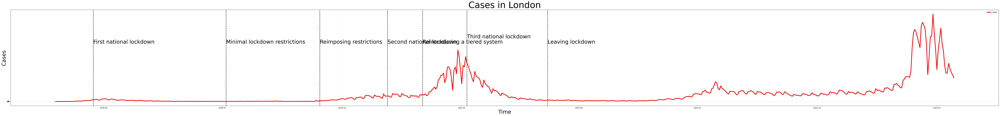

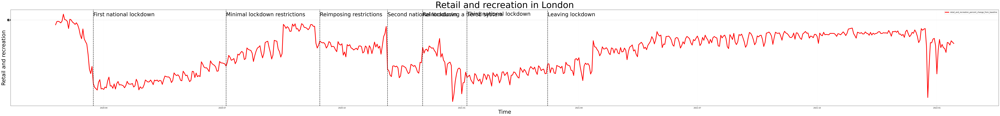

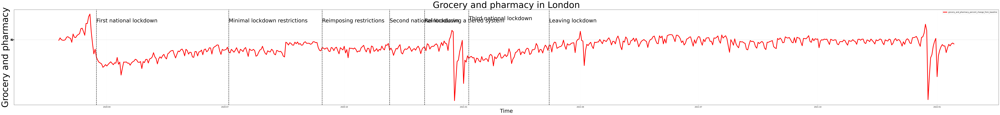

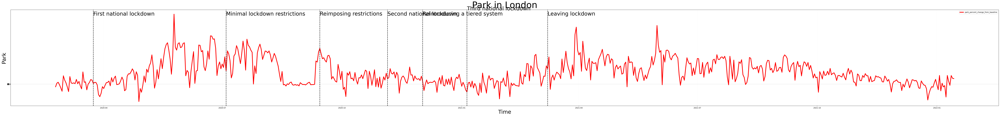

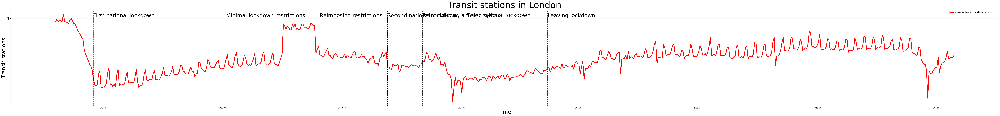

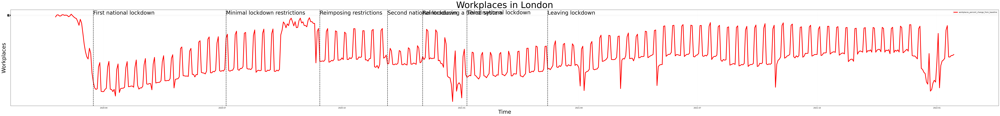

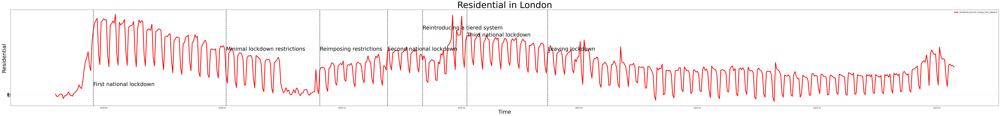

In [19]:
# Plot London
cases = cm_d['new_cases']
retail = cm_d['retail']
grocery = cm_d['grocery']
park = cm_d['parks']
transit = cm_d['transit']
workplaces = cm_d['workplaces']
residential = cm_d['residential']
date = cm_d['date']

plt.figure(figsize=(100, 10), dpi=200)
plt.plot(date, cases, c='r', label="cases",lw=4)
plt.axvline(pd.to_datetime('2020-03-24'), color="black", linestyle="--",lw=2)
plt.axvline(pd.to_datetime('2020-07-04'), color="black", linestyle="--",lw=2)
plt.axvline(pd.to_datetime('2020-09-14'), color="black", linestyle="--",lw=2)
plt.axvline(pd.to_datetime('2020-11-05'), color="black", linestyle="--",lw=2)
plt.axvline(pd.to_datetime('2020-12-02'), color="black", linestyle="--",lw=2)
plt.axvline(pd.to_datetime('2021-01-05'), color="black", linestyle="--",lw=2)
plt.axvline(pd.to_datetime('2021-03-08'), color="black", linestyle="--",lw=2)
plt.text(pd.to_datetime('2020-03-24'),22000,'First national lockdown', fontdict={'size': 30})
plt.text(pd.to_datetime('2020-07-04'),22000,'Minimal lockdown restrictions', fontdict={'size': 30})
plt.text(pd.to_datetime('2020-09-14'),22000,'Reimposing restrictions', fontdict={'size': 30})
plt.text(pd.to_datetime('2020-11-05'),22000,'Second national lockdown', fontdict={'size': 30})
plt.text(pd.to_datetime('2020-12-02'),22000,'Reintroducing a tiered system', fontdict={'size': 30})
plt.text(pd.to_datetime('2021-01-05'),24000,'Third national lockdown', fontdict={'size': 30})
plt.text(pd.to_datetime('2021-03-08'),22000,'Leaving lockdown', fontdict={'size': 30})
plt.legend(loc='best')
plt.yticks(range(0, 50, 5))
plt.grid(True, linestyle='-', alpha=0.5,linewidth=0.1)
plt.xlabel("Time", fontdict={'size': 30})
plt.ylabel("Cases", fontdict={'size': 30})
plt.title("Cases in London", fontdict={'size': 50})
plt.show()

plt.figure(figsize=(100, 10), dpi=200)
plt.plot(date, retail, c='r', label='retail_and_recreation_percent_change_from_baseline',lw=4)
plt.axvline(pd.to_datetime('2020-03-24'), color="black", linestyle="--",lw=2)
plt.axvline(pd.to_datetime('2020-07-04'), color="black", linestyle="--",lw=2)
plt.axvline(pd.to_datetime('2020-09-14'), color="black", linestyle="--",lw=2)
plt.axvline(pd.to_datetime('2020-11-05'), color="black", linestyle="--",lw=2)
plt.axvline(pd.to_datetime('2020-12-02'), color="black", linestyle="--",lw=2)
plt.axvline(pd.to_datetime('2021-01-05'), color="black", linestyle="--",lw=2)
plt.axvline(pd.to_datetime('2021-03-08'), color="black", linestyle="--",lw=2)
plt.text(pd.to_datetime('2020-03-24'),160,'First national lockdown', fontdict={'size': 30})
plt.text(pd.to_datetime('2020-07-04'),160,'Minimal lockdown restrictions', fontdict={'size': 30})
plt.text(pd.to_datetime('2020-09-14'),160,'Reimposing restrictions', fontdict={'size': 30})
plt.text(pd.to_datetime('2020-11-05'),160,'Second national lockdown', fontdict={'size': 30})
plt.text(pd.to_datetime('2020-12-02'),160,'Reintroducing a tiered system', fontdict={'size': 30})
plt.text(pd.to_datetime('2021-01-05'),180,'Third national lockdown', fontdict={'size': 30})
plt.text(pd.to_datetime('2021-03-08'),160,'Leaving lockdown', fontdict={'size': 30})
plt.legend(loc='best')
plt.yticks(range(0, 50, 5))
plt.grid(True, linestyle='-', alpha=0.5,linewidth=0.1)
plt.xlabel("Time", fontdict={'size': 30})
plt.ylabel("Retail and recreation", fontdict={'size': 30})
plt.title("Retail and recreation in London", fontdict={'size': 50})
plt.show()

plt.figure(figsize=(100, 10), dpi=200)
plt.plot(date, grocery, c='r', label="grocery_and_pharmacy_percent_change_from_baseline",lw=4)
plt.axvline(pd.to_datetime('2020-03-24'), color="black", linestyle="--",lw=2)
plt.axvline(pd.to_datetime('2020-07-04'), color="black", linestyle="--",lw=2)
plt.axvline(pd.to_datetime('2020-09-14'), color="black", linestyle="--",lw=2)
plt.axvline(pd.to_datetime('2020-11-05'), color="black", linestyle="--",lw=2)
plt.axvline(pd.to_datetime('2020-12-02'), color="black", linestyle="--",lw=2)
plt.axvline(pd.to_datetime('2021-01-05'), color="black", linestyle="--",lw=2)
plt.axvline(pd.to_datetime('2021-03-08'), color="black", linestyle="--",lw=2)
plt.text(pd.to_datetime('2020-03-24'),800,'First national lockdown', fontdict={'size': 30})
plt.text(pd.to_datetime('2020-07-04'),800,'Minimal lockdown restrictions', fontdict={'size': 30})
plt.text(pd.to_datetime('2020-09-14'),800,'Reimposing restrictions', fontdict={'size': 30})
plt.text(pd.to_datetime('2020-11-05'),800,'Second national lockdown', fontdict={'size': 30})
plt.text(pd.to_datetime('2020-12-02'),800,'Reintroducing a tiered system', fontdict={'size': 30})
plt.text(pd.to_datetime('2021-01-05'),900,'Third national lockdown', fontdict={'size': 30})
plt.text(pd.to_datetime('2021-03-08'),800,'Leaving lockdown', fontdict={'size': 30})
plt.legend(loc='best')
plt.yticks(range(0, 50, 5))
plt.grid(True, linestyle='-', alpha=0.5,linewidth=0.1)
plt.xlabel("Time", fontdict={'size': 30})
plt.ylabel("Grocery and pharmacy", fontdict={'size': 50})
plt.title("Grocery and pharmacy in London", fontdict={'size': 50})
plt.show()

plt.figure(figsize=(100, 10), dpi=200)
plt.plot(date, park, c='r', label='park_percent_change_from_baseline',lw=4)
plt.axvline(pd.to_datetime('2020-03-24'), color="black", linestyle="--",lw=2)
plt.axvline(pd.to_datetime('2020-07-04'), color="black", linestyle="--",lw=2)
plt.axvline(pd.to_datetime('2020-09-14'), color="black", linestyle="--",lw=2)
plt.axvline(pd.to_datetime('2020-11-05'), color="black", linestyle="--",lw=2)
plt.axvline(pd.to_datetime('2020-12-02'), color="black", linestyle="--",lw=2)
plt.axvline(pd.to_datetime('2021-01-05'), color="black", linestyle="--",lw=2)
plt.axvline(pd.to_datetime('2021-03-08'), color="black", linestyle="--",lw=2)
plt.text(pd.to_datetime('2020-03-24'),6500,'First national lockdown', fontdict={'size': 30})
plt.text(pd.to_datetime('2020-07-04'),6500,'Minimal lockdown restrictions', fontdict={'size': 30})
plt.text(pd.to_datetime('2020-09-14'),6500,'Reimposing restrictions', fontdict={'size': 30})
plt.text(pd.to_datetime('2020-11-05'),6500,'Second national lockdown', fontdict={'size': 30})
plt.text(pd.to_datetime('2020-12-02'),6500,'Reintroducing a tiered system', fontdict={'size': 30})
plt.text(pd.to_datetime('2021-01-05'),7000,'Third national lockdown', fontdict={'size': 30})
plt.text(pd.to_datetime('2021-03-08'),6500,'Leaving lockdown', fontdict={'size': 30})
plt.legend(loc='best')
plt.yticks(range(0, 50, 5))
plt.grid(True, linestyle='-', alpha=0.5,linewidth=0.1)
plt.xlabel("Time", fontdict={'size': 30})
plt.ylabel("Park", fontdict={'size': 30})
plt.title("Park in London", fontdict={'size': 50})
plt.show()

plt.figure(figsize=(100, 10), dpi=200)
plt.plot(date, transit, c='r', label="transit_stations_percent_change_from_baseline",lw=4)
plt.axvline(pd.to_datetime('2020-03-24'), color="black", linestyle="--",lw=2)
plt.axvline(pd.to_datetime('2020-07-04'), color="black", linestyle="--",lw=2)
plt.axvline(pd.to_datetime('2020-09-14'), color="black", linestyle="--",lw=2)
plt.axvline(pd.to_datetime('2020-11-05'), color="black", linestyle="--",lw=2)
plt.axvline(pd.to_datetime('2020-12-02'), color="black", linestyle="--",lw=2)
plt.axvline(pd.to_datetime('2021-01-05'), color="black", linestyle="--",lw=2)
plt.axvline(pd.to_datetime('2021-03-08'), color="black", linestyle="--",lw=2)
plt.text(pd.to_datetime('2020-03-24'),65,'First national lockdown', fontdict={'size': 30})
plt.text(pd.to_datetime('2020-07-04'),65,'Minimal lockdown restrictions', fontdict={'size': 30})
plt.text(pd.to_datetime('2020-09-14'),65,'Reimposing restrictions', fontdict={'size': 30})
plt.text(pd.to_datetime('2020-11-05'),65,'Second national lockdown', fontdict={'size': 30})
plt.text(pd.to_datetime('2020-12-02'),65,'Reintroducing a tiered system', fontdict={'size': 30})
plt.text(pd.to_datetime('2021-01-05'),75,'Third national lockdown', fontdict={'size': 30})
plt.text(pd.to_datetime('2021-03-08'),65,'Leaving lockdown', fontdict={'size': 30})
plt.legend(loc='best')
plt.yticks(range(0, 50, 5))
plt.grid(True, linestyle='-', alpha=0.5,linewidth=0.1)
plt.xlabel("Time", fontdict={'size': 30})
plt.ylabel("Transit stations", fontdict={'size': 30})
plt.title("Transit stations in London", fontdict={'size': 50})
plt.show()

plt.figure(figsize=(100, 10), dpi=200)
plt.plot(date, workplaces, c='r', label='workplaces_percent_change_from_baseline',lw=4)
plt.axvline(pd.to_datetime('2020-03-24'), color="black", linestyle="--",lw=2)
plt.axvline(pd.to_datetime('2020-07-04'), color="black", linestyle="--",lw=2)
plt.axvline(pd.to_datetime('2020-09-14'), color="black", linestyle="--",lw=2)
plt.axvline(pd.to_datetime('2020-11-05'), color="black", linestyle="--",lw=2)
plt.axvline(pd.to_datetime('2020-12-02'), color="black", linestyle="--",lw=2)
plt.axvline(pd.to_datetime('2021-01-05'), color="black", linestyle="--",lw=2)
plt.axvline(pd.to_datetime('2021-03-08'), color="black", linestyle="--",lw=2)
plt.text(pd.to_datetime('2020-03-24'),50,'First national lockdown', fontdict={'size': 30})
plt.text(pd.to_datetime('2020-07-04'),50,'Minimal lockdown restrictions', fontdict={'size': 30})
plt.text(pd.to_datetime('2020-09-14'),50,'Reimposing restrictions', fontdict={'size': 30})
plt.text(pd.to_datetime('2020-11-05'),50,'Second national lockdown', fontdict={'size': 30})
plt.text(pd.to_datetime('2020-12-02'),50,'Reintroducing a tiered system', fontdict={'size': 30})
plt.text(pd.to_datetime('2021-01-05'),60,'Third national lockdown', fontdict={'size': 30})
plt.text(pd.to_datetime('2021-03-08'),50,'Leaving lockdown', fontdict={'size': 30})
plt.legend(loc='best')
plt.yticks(range(0, 50, 5))
plt.grid(True, linestyle='-', alpha=0.5,linewidth=0.1)
plt.xlabel("Time", fontdict={'size': 30})
plt.ylabel("Workplaces", fontdict={'size': 30})
plt.title("Workplaces in London", fontdict={'size': 50})
plt.show()

plt.figure(figsize=(100, 10), dpi=200)
plt.plot(date, residential, c='r', label="residential_percent_change_from_baseline",lw=4)
plt.axvline(pd.to_datetime('2020-03-24'), color="black", linestyle="--",lw=2)
plt.axvline(pd.to_datetime('2020-07-04'), color="black", linestyle="--",lw=2)
plt.axvline(pd.to_datetime('2020-09-14'), color="black", linestyle="--",lw=2)
plt.axvline(pd.to_datetime('2020-11-05'), color="black", linestyle="--",lw=2)
plt.axvline(pd.to_datetime('2020-12-02'), color="black", linestyle="--",lw=2)
plt.axvline(pd.to_datetime('2021-01-05'), color="black", linestyle="--",lw=2)
plt.axvline(pd.to_datetime('2021-03-08'), color="black", linestyle="--",lw=2)
plt.text(pd.to_datetime('2020-03-24'),150,'First national lockdown', fontdict={'size': 30})
plt.text(pd.to_datetime('2020-07-04'),650,'Minimal lockdown restrictions', fontdict={'size': 30})
plt.text(pd.to_datetime('2020-09-14'),650,'Reimposing restrictions', fontdict={'size': 30})
plt.text(pd.to_datetime('2020-11-05'),650,'Second national lockdown', fontdict={'size': 30})
plt.text(pd.to_datetime('2020-12-02'),950,'Reintroducing a tiered system', fontdict={'size': 30})
plt.text(pd.to_datetime('2021-01-05'),850,'Third national lockdown', fontdict={'size': 30})
plt.text(pd.to_datetime('2021-03-08'),650,'Leaving lockdown', fontdict={'size': 30})
plt.legend(loc='best')
plt.yticks(range(0, 50, 5))
plt.grid(True, linestyle='-', alpha=0.5,linewidth=0.1)
plt.xlabel("Time", fontdict={'size': 30})
plt.ylabel("Residential", fontdict={'size': 30})
plt.title("Residential in London", fontdict={'size': 50})
plt.show()

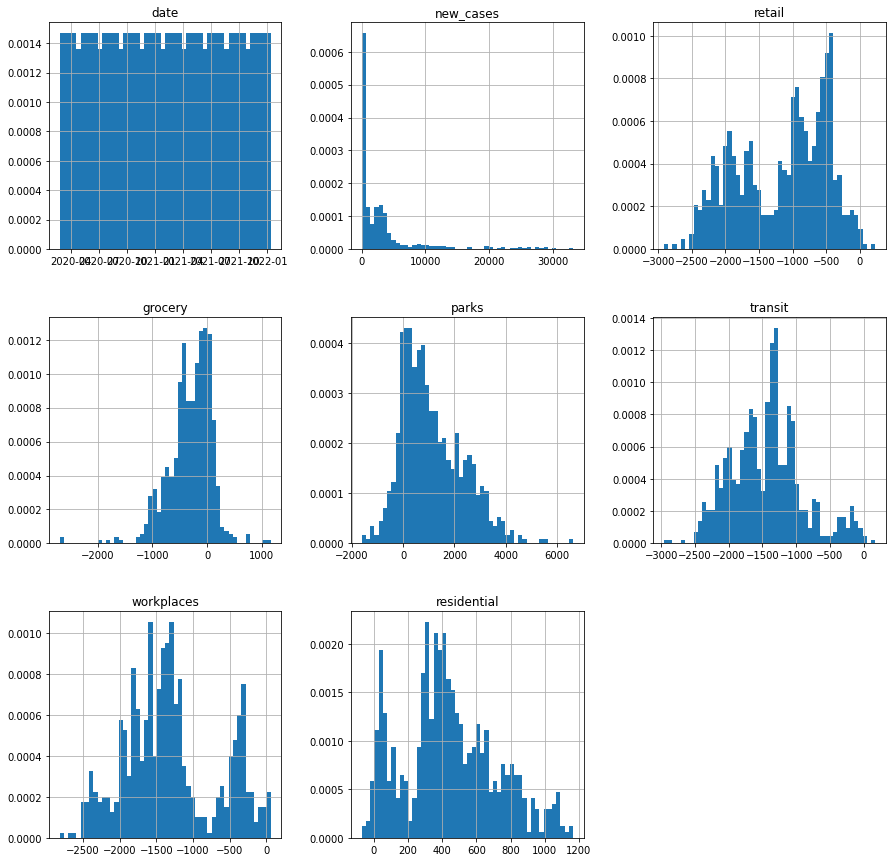

In [20]:
cm_d.hist(density=True,figsize=(15,15),bins=50)
plt.show()

### 2.3 Boxplots

([], [])

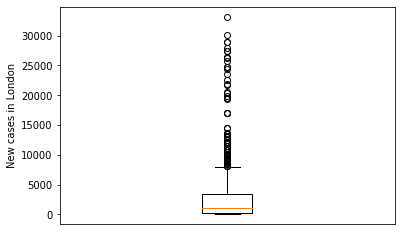

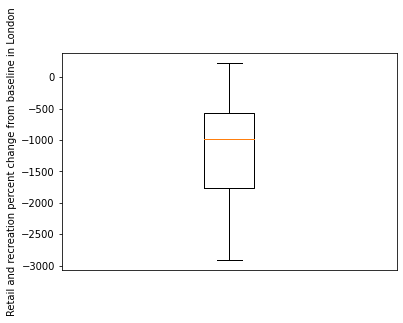

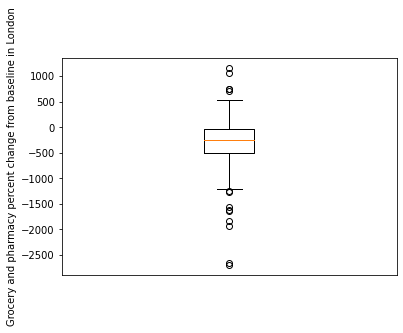

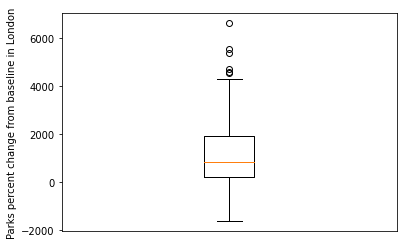

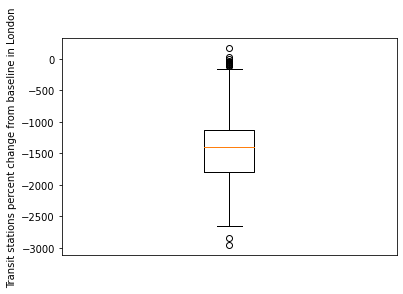

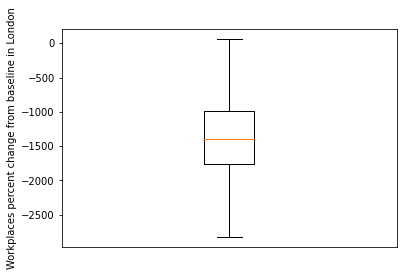

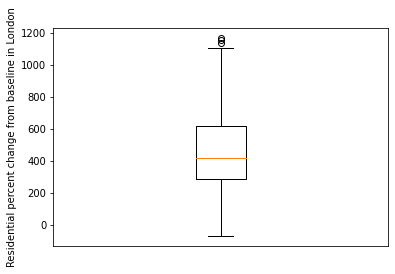

In [21]:
#boxplot for each data
plt.figure(1)
plt.boxplot(cm_d['new_cases']) #-> seems to be a few with high obesidy %
plt.ylabel("New cases in London")
plt.xticks([])
#plt.savefig('xx.jpg')

plt.figure(2)
plt.boxplot(cm_d['retail'])
plt.ylabel("Retail and recreation percent change from baseline in London")
plt.xticks([])
#plt.savefig('xx.jpg')

plt.figure(3)
plt.boxplot(cm_d['grocery'])
plt.ylabel("Grocery and pharmacy percent change from baseline in London")
plt.xticks([])
#plt.savefig('xx.jpg')


#plot cleaned tax data
plt.figure(4)
plt.boxplot(cm_d['parks'])
plt.ylabel("Parks percent change from baseline in London")
plt.xticks([])
#plt.savefig('xx_rm.jpg')

plt.figure(5)
plt.boxplot(cm_d['transit'])
plt.ylabel("Transit stations percent change from baseline in London")
plt.xticks([])
#plt.savefig('xx.jpg')

plt.figure(6)
plt.boxplot(cm_d['workplaces'])
plt.ylabel("Workplaces percent change from baseline in London")
plt.xticks([])
#plt.savefig('xx.jpg')

plt.figure(7)
plt.boxplot(cm_d['residential'])
plt.ylabel("Residential percent change from baseline in London")
plt.xticks([])
#plt.savefig('xx.jpg')

## 3.Question 1: Which location needed to be limited? Multiple Linear Regression

### 3.1 Before log transformation: multiple linear regression

<ipython-input-22-1e4e1fd12ad4>:5: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  mask = np.triu(np.ones_like(corr, dtype=np.bool))


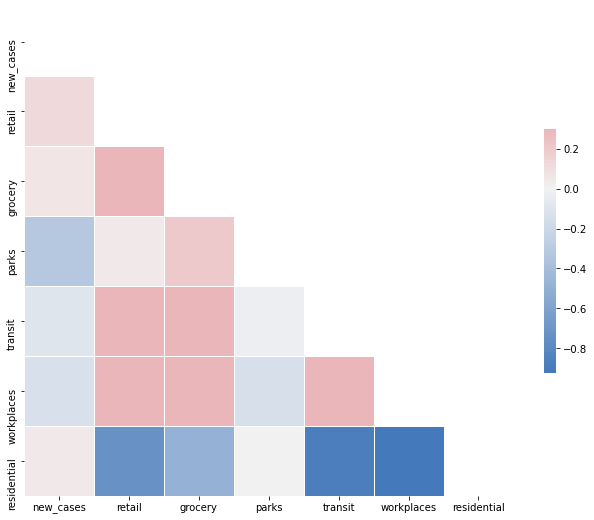

In [22]:
# Compute the correlation matrix
corr = cm_d.corr()

# Generate a mask for the upper triangle
mask = np.triu(np.ones_like(corr, dtype=np.bool))

# Set up the matplotlib figure
f, ax = plt.subplots(figsize=(11, 9))

# Generate a custom diverging colormap
cmap = sns.diverging_palette(250, 10, as_cmap=True)

# Draw the heatmap with the mask and correct aspect ratio
sns.heatmap(corr, mask=mask, cmap=cmap, vmax=.3, center=0,
            square=True, linewidths=.5, cbar_kws={"shrink": .5})

plt.show()

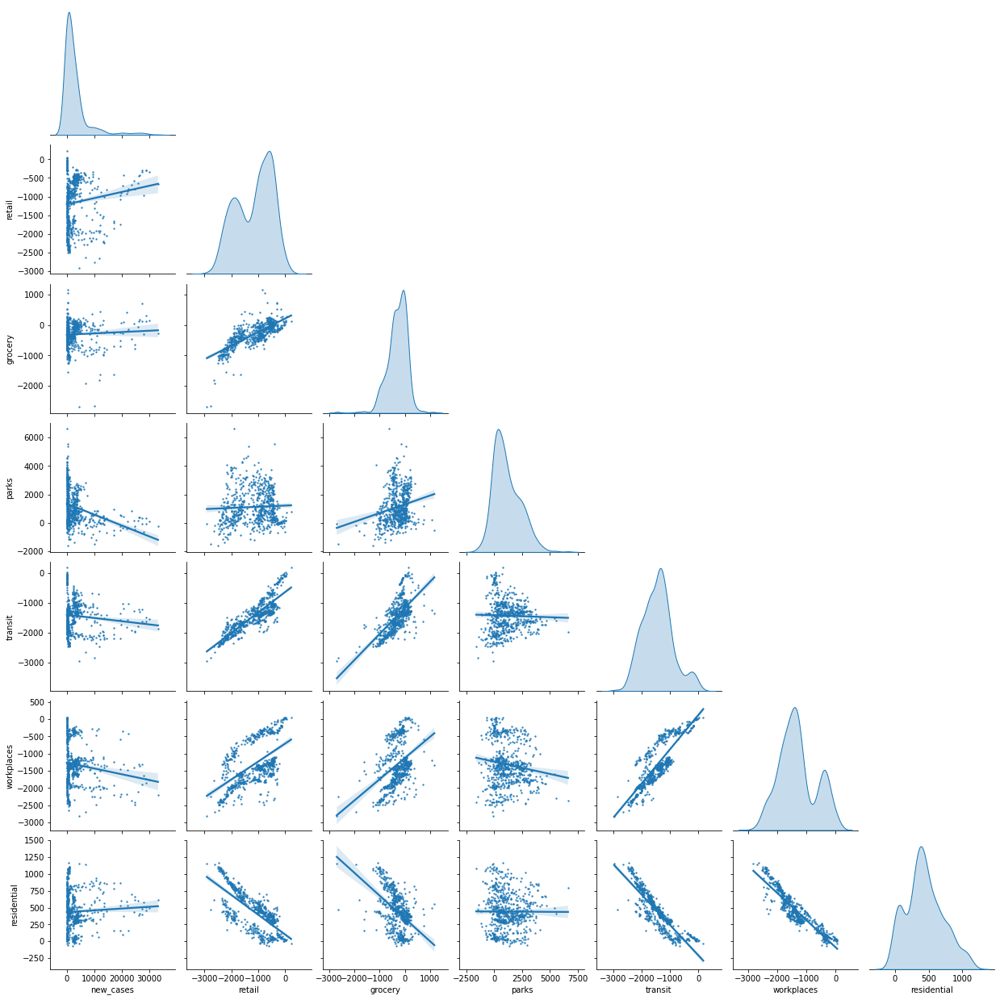

In [23]:
sns.pairplot(cm_d, corner=True, kind='reg', diag_kind='kde', plot_kws=dict(scatter_kws=dict(s=2)))
plt.show()

In [24]:
# calculating VIF
# This function is adjusted from: https://stackoverflow.com/a/51329496/4667568
from statsmodels.stats.outliers_influence import variance_inflation_factor 
from statsmodels.tools.tools import add_constant

def drop_column_using_vif_(cm_d, thresh=5):
    '''
    Calculates VIF each feature in a pandas dataframe, and repeatedly drop the columns with the highest VIF
    A constant must be added to variance_inflation_factor or the results will be incorrect

    :param df: the pandas dataframe containing only the predictor features, not the response variable
    :param thresh: (default 5) the threshould VIF value. If the VIF of a variable is greater than thresh, it should be removed from the dataframe
    :return: dataframe with multicollinear features removed
    '''
    while True:
        # adding a constatnt item to the data. add_constant is a function from statsmodels (see the import above)
        df_with_const = add_constant(cm_f)

        vif_df = pd.Series([variance_inflation_factor(df_with_const.values, i) 
               for i in range(df_with_const.shape[1])], name= "VIF",
              index=df_with_const.columns).to_frame()

        # drop the const
        vif_df = vif_df.drop('const')
        
        # if the largest VIF is above the thresh, remove a variable with the largest VIF
        # If there are multiple variabels with VIF>thresh, only one of them is removed. This is because we want to keep as many variables as possible
        if vif_df.VIF.max() > thresh:
            # If there are multiple variables with the maximum VIF, choose the first one
            index_to_drop = vif_df.index[vif_df.VIF == vif_df.VIF.max()].tolist()[0]
            print('Dropping: {}'.format(index_to_drop))
            cm_d = cm_d.drop(columns = index_to_drop)
        else:
            # No VIF is above threshold. Exit the loop
            break

    return cm_d

In [25]:
cm_d.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 691 entries, 9 to 699
Data columns (total 8 columns):
 #   Column       Non-Null Count  Dtype         
---  ------       --------------  -----         
 0   date         691 non-null    datetime64[ns]
 1   new_cases    691 non-null    int64         
 2   retail       691 non-null    float64       
 3   grocery      691 non-null    float64       
 4   parks        691 non-null    float64       
 5   transit      691 non-null    int64         
 6   workplaces   691 non-null    float64       
 7   residential  691 non-null    float64       
dtypes: datetime64[ns](1), float64(5), int64(2)
memory usage: 48.6 KB


In [26]:
cm_d2 = cm_d.drop(columns=['date','new_cases'])

In [27]:
#d Impact of each intervention area - multiple regression
#regression analysis
cm_result = sm.OLS(endog=cm_d[['new_cases']], exog=sm.add_constant(cm_d2)).fit()
cm_result.summary()

/opt/anaconda3/lib/python3.8/site-packages/statsmodels/tsa/tsatools.py:142: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only
  x = pd.concat(x[::order], 1)


<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:              new_cases   R-squared:                       0.379
Model:                            OLS   Adj. R-squared:                  0.374
Method:                 Least Squares   F-statistic:                     69.61
Date:                Tue, 18 Jan 2022   Prob (F-statistic):           1.39e-67
Time:                        02:29:30   Log-Likelihood:                -6704.2
No. Observations:                 691   AIC:                         1.342e+04
Df Residuals:                     684   BIC:                         1.345e+04
Df Model:                           6                                         
Covariance Type:            nonrobust                                         
===============================================================================
                  coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------
const       -1682.1463    571.414     -2.944      0.003   -2804.082    -560.210
retail          7.4063      0.842      8.795      0.000       5.753       9.060
grocery         1.0678      0.657      1.626      0.104      -0.221       2.357
parks          -1.7400      0.148    -11.761      0.000      -2.030      -1.449
transit       -13.4394      1.210    -11.103      0.000     -15.816     -11.063
workplaces      0.4891      1.138      0.430      0.667      -1.745       2.723
residential    -7.1441      2.344     -3.048      0.002     -11.747      -2.541
==============================================================================
Omnibus:                      314.358   Durbin-Watson:                   0.308
Prob(Omnibus):                  0.000   Jarque-Bera (JB):             1549.202
Skew:                           2.058   Prob(JB):                         0.00
Kurtosis:                       9.071   Cond. No.                     1.06e+04
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 1.06e+04. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

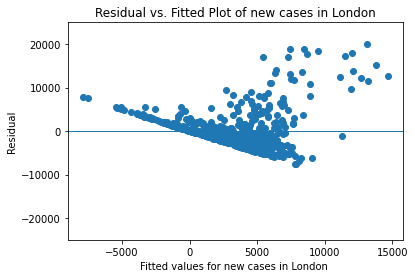

In [28]:
# plot 
plt.scatter(cm_result.fittedvalues, cm_result.resid)
# adding title and labels
plt.xlabel('Fitted values for new cases in London ')
plt.ylabel('Residual')
plt.ylim(-25000,25000)
plt.title('Residual vs. Fitted Plot of new cases in London')
plt.axhline(linewidth=1)
plt.show()

### 3.2 After log transformation: multiple linear regression

因为new cases有0值，因此采用box-cox变换

In [29]:
cm_d['l_cases'] = pd.np.log(cm_d['new_cases']+1)

<ipython-input-29-b4b3a51622a2>:1: FutureWarning: The pandas.np module is deprecated and will be removed from pandas in a future version. Import numpy directly instead
  cm_d['l_cases'] = pd.np.log(cm_d['new_cases']+1)


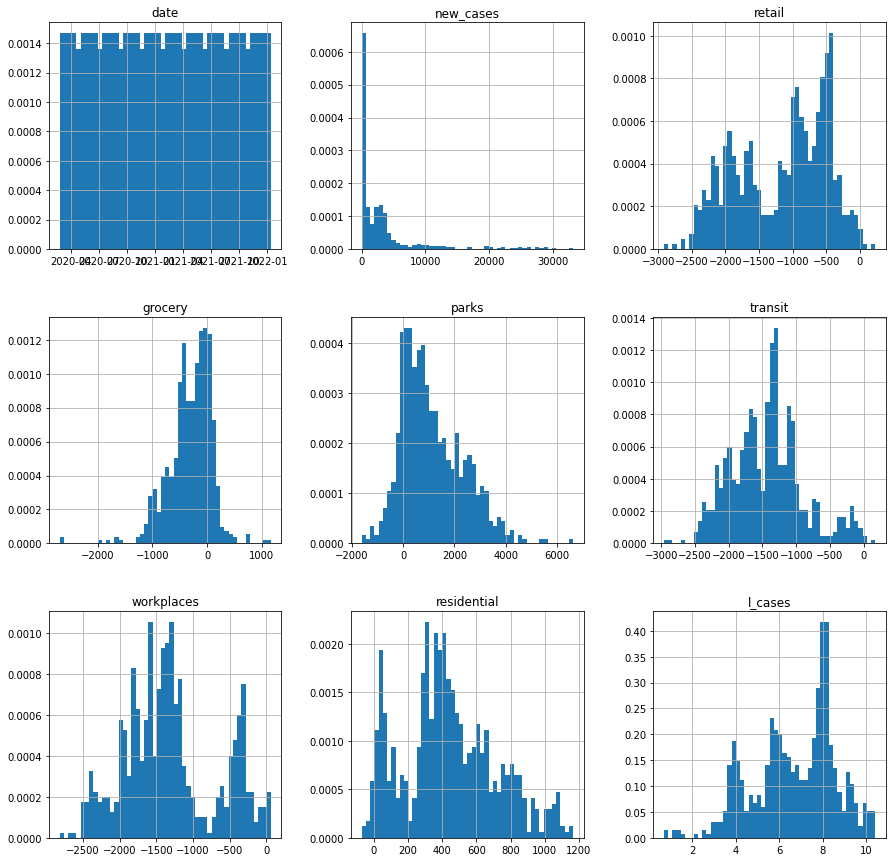

In [97]:
cm_d.hist(density=True,figsize=(15,15),bins=50)
plt.show()

([], [])

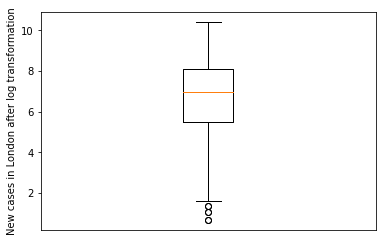

In [30]:
#inner London 
plt.figure() 
plt.boxplot(cm_d['l_cases'])
plt.ylabel("New cases in London after log transformation") 
plt.xticks([]) #plt.savefig('xx.jpg')

In [31]:
# calculating VIF
# This function is adjusted from: https://stackoverflow.com/a/51329496/4667568
from statsmodels.stats.outliers_influence import variance_inflation_factor 
from statsmodels.tools.tools import add_constant

def drop_column_using_vif_(cm_d, thresh=5):
    '''
    Calculates VIF each feature in a pandas dataframe, and repeatedly drop the columns with the highest VIF
    A constant must be added to variance_inflation_factor or the results will be incorrect

    :param df: the pandas dataframe containing only the predictor features, not the response variable
    :param thresh: (default 5) the threshould VIF value. If the VIF of a variable is greater than thresh, it should be removed from the dataframe
    :return: dataframe with multicollinear features removed
    '''
    while True:
        # adding a constatnt item to the data. add_constant is a function from statsmodels (see the import above)
        df_with_const = add_constant(cm_d)

        vif_df = pd.Series([variance_inflation_factor(df_with_const.values, i) 
               for i in range(df_with_const.shape[1])], name= "VIF",
              index=df_with_const.columns).to_frame()

        # drop the const
        vif_df = vif_df.drop('const')
        
        # if the largest VIF is above the thresh, remove a variable with the largest VIF
        # If there are multiple variabels with VIF>thresh, only one of them is removed. This is because we want to keep as many variables as possible
        if vif_df.VIF.max() > thresh:
            # If there are multiple variables with the maximum VIF, choose the first one
            index_to_drop = vif_df.index[vif_df.VIF == vif_df.VIF.max()].tolist()[0]
            print('Dropping: {}'.format(index_to_drop))
            cm_d = cm_d.drop(columns = index_to_drop)
        else:
            # No VIF is above threshold. Exit the loop
            break

    return cm_d

In [32]:
cm_d3 = cm_d.drop(columns=['date','new_cases','l_cases'])

In [33]:
cm_d3

,retail,grocery,parks,transit,workplaces,residential
9,-150.0,-3.0,-228.0,-88,-28.0,34.0
10,-34.0,104.0,113.0,-7,34.0,1.0
11,-24.0,21.0,199.0,-86,40.0,3.0
12,-43.0,0.0,-33.0,-59,1.0,29.0
13,-81.0,-3.0,-329.0,-51,3.0,35.0
...,...,...,...,...,...,...
695,-806.0,-185.0,301.0,-1421,-1350.0,446.0
696,-880.0,-254.0,-88.0,-1421,-1351.0,460.0
697,-727.0,-162.0,830.0,-1361,-1305.0,437.0
698,-777.0,-125.0,576.0,-1398,-1299.0,439.0


In [34]:
#d Impact of each intervention area - multiple regression
#regression analysis
cm_result2 = sm.OLS(endog=cm_d[['l_cases']], exog=sm.add_constant(cm_d3)).fit()
cm_result2.summary()

/opt/anaconda3/lib/python3.8/site-packages/statsmodels/tsa/tsatools.py:142: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only
  x = pd.concat(x[::order], 1)


<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                l_cases   R-squared:                       0.543
Model:                            OLS   Adj. R-squared:                  0.539
Method:                 Least Squares   F-statistic:                     135.4
Date:                Tue, 18 Jan 2022   Prob (F-statistic):          9.43e-113
Time:                        02:29:30   Log-Likelihood:                -1145.5
No. Observations:                 691   AIC:                             2305.
Df Residuals:                     684   BIC:                             2337.
Df Model:                           6                                         
Covariance Type:            nonrobust                                         
===============================================================================
                  coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------
const           3.9779      0.183     21.696      0.000       3.618       4.338
retail          0.0022      0.000      8.199      0.000       0.002       0.003
grocery         0.0012      0.000      5.559      0.000       0.001       0.002
parks          -0.0008   4.75e-05    -16.957      0.000      -0.001      -0.001
transit        -0.0057      0.000    -14.781      0.000      -0.007      -0.005
workplaces     -0.0011      0.000     -2.950      0.003      -0.002      -0.000
residential    -0.0070      0.001     -9.315      0.000      -0.008      -0.006
==============================================================================
Omnibus:                        4.781   Durbin-Watson:                   0.509
Prob(Omnibus):                  0.092   Jarque-Bera (JB):                4.714
Skew:                          -0.171   Prob(JB):                       0.0947
Kurtosis:                       2.785   Cond. No.                     1.06e+04
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 1.06e+04. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

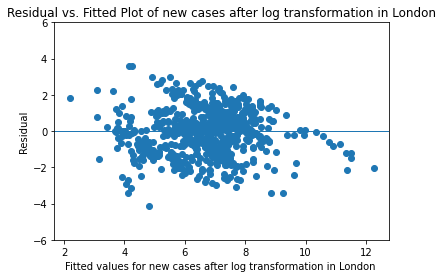

In [35]:
# plot 
plt.scatter(cm_result2.fittedvalues, cm_result2.resid)
# adding title and labels
plt.xlabel('Fitted values for new cases after log transformation in London ')
plt.ylabel('Residual')
plt.ylim(-6,6)
plt.title('Residual vs. Fitted Plot of new cases after log transformation in London')
plt.axhline(linewidth=1)
plt.show()

### 3.3 Deal with time lag and log

#### for example 15 days

In [36]:
cm_15 = cm_d.copy(deep=True)
cm_15.retail = cm_15.retail.shift(15)
cm_15.grocery = cm_15.grocery.shift(15)
cm_15.parks = cm_15.parks.shift(15)
cm_15.transit = cm_15.transit.shift(15)
cm_15.workplaces = cm_15.workplaces.shift(15)
cm_15.residential = cm_15.residential.shift(15)
cm_15 = cm_15.dropna()
cm_15

,date,new_cases,retail,grocery,parks,transit,workplaces,residential,l_cases
24,2020-03-10,92,-150.0,-3.0,-228.0,-88.0,-28.0,34.0,4.532599
25,2020-03-11,183,-34.0,104.0,113.0,-7.0,34.0,1.0,5.214936
26,2020-03-12,166,-24.0,21.0,199.0,-86.0,40.0,3.0,5.117994
27,2020-03-13,134,-43.0,0.0,-33.0,-59.0,1.0,29.0,4.905275
28,2020-03-14,150,-81.0,-3.0,-329.0,-51.0,3.0,35.0,5.017280
...,...,...,...,...,...,...,...,...,...
695,2022-01-10,14478,-1653.0,-1635.0,-847.0,-1850.0,-1238.0,157.0,9.580455
696,2022-01-11,12534,-794.0,-782.0,-462.0,-1961.0,-2477.0,611.0,9.436280
697,2022-01-12,11126,-800.0,-646.0,-218.0,-1971.0,-2423.0,661.0,9.317130
698,2022-01-13,10140,-666.0,-273.0,-266.0,-1866.0,-2208.0,620.0,9.224342


In [37]:
cm_15f = cm_15.drop(columns=['date','new_cases','l_cases'])

In [38]:
#d Impact of each intervention area - multiple regression
#regression analysis
cm_15r = sm.OLS(endog=cm_15[['l_cases']], exog=sm.add_constant(cm_15f)).fit()
cm_15r.summary()

/opt/anaconda3/lib/python3.8/site-packages/statsmodels/tsa/tsatools.py:142: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only
  x = pd.concat(x[::order], 1)


<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                l_cases   R-squared:                       0.518
Model:                            OLS   Adj. R-squared:                  0.513
Method:                 Least Squares   F-statistic:                     119.7
Date:                Tue, 18 Jan 2022   Prob (F-statistic):          1.69e-102
Time:                        02:29:30   Log-Likelihood:                -1094.8
No. Observations:                 676   AIC:                             2204.
Df Residuals:                     669   BIC:                             2235.
Df Model:                           6                                         
Covariance Type:            nonrobust                                         
===============================================================================
                  coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------
const           6.0953      0.177     34.464      0.000       5.748       6.443
retail          0.0023      0.000      8.525      0.000       0.002       0.003
grocery         0.0010      0.000      4.936      0.000       0.001       0.001
parks          -0.0008   4.61e-05    -17.051      0.000      -0.001      -0.001
transit        -0.0044      0.000    -11.454      0.000      -0.005      -0.004
workplaces     -0.0003      0.000     -0.809      0.419      -0.001       0.000
residential    -0.0048      0.001     -6.522      0.000      -0.006      -0.003
==============================================================================
Omnibus:                       16.519   Durbin-Watson:                   0.427
Prob(Omnibus):                  0.000   Jarque-Bera (JB):               17.721
Skew:                          -0.338   Prob(JB):                     0.000142
Kurtosis:                       3.414   Cond. No.                     1.05e+04
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 1.05e+04. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

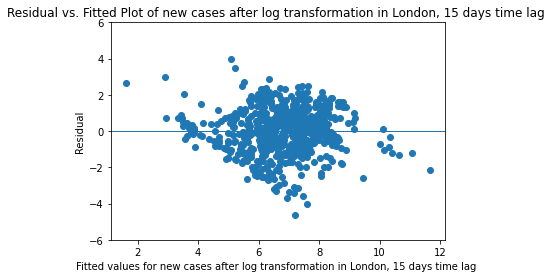

In [39]:
# plot 
plt.scatter(cm_15r.fittedvalues, cm_15r.resid)
# adding title and labels
plt.xlabel('Fitted values for new cases after log transformation in London, 15 days time lag ')
plt.ylabel('Residual')
plt.ylim(-6,6)
plt.title('Residual vs. Fitted Plot of new cases after log transformation in London, 15 days time lag ')
plt.axhline(linewidth=1)
plt.show()

## 4.Question 2: Do we need to limit mobility now?

In [40]:
cm_t=cm_d.copy(deep=True)
cm_t.head(50)

,date,new_cases,retail,grocery,parks,transit,workplaces,residential,l_cases
9,2020-02-24,1,-150.0,-3.0,-228.0,-88,-28.0,34.0,0.693147
10,2020-02-25,3,-34.0,104.0,113.0,-7,34.0,1.0,1.386294
11,2020-02-26,2,-24.0,21.0,199.0,-86,40.0,3.0,1.098612
12,2020-02-27,2,-43.0,0.0,-33.0,-59,1.0,29.0,1.098612
13,2020-02-28,3,-81.0,-3.0,-329.0,-51,3.0,35.0,1.386294
14,2020-02-29,1,-13.0,23.0,-649.0,-99,42.0,30.0,0.693147
15,2020-03-01,4,232.0,134.0,809.0,174,40.0,-28.0,1.609438
16,2020-03-02,12,38.0,158.0,403.0,-88,22.0,11.0,2.564949
17,2020-03-03,7,24.0,109.0,149.0,-112,32.0,12.0,2.079442
18,2020-03-04,19,-26.0,85.0,-231.0,-114,19.0,34.0,2.995732


In [41]:
cm_t['google_m']= (cm_t.retail+cm_t.grocery+cm_t.transit+cm_t.workplaces)/4
cm_t.drop(columns=['retail','grocery','parks','transit','workplaces','residential'], inplace=True)

In [42]:
cm_t.describe()

,new_cases,l_cases,google_m
count,691.000000,691.000000,691.000000
mean,2980.775687,6.724047,-1051.857091
std,5025.329587,1.879220,488.850405
min,1.000000,0.693147,-2847.750000
25%,242.500000,5.495115,-1364.125000
50%,1080.000000,6.985642,-990.250000
75%,3347.500000,8.116264,-713.500000
max,33167.000000,10.409341,145.000000


In [43]:
# Plot all componets and restriction policy timeline
plt.figure(figsize=(100, 50), dpi=200)
cases_t = cm_t['new_cases']
date_t = cm_t['date']
m_t = cm_t['google_m']
plt.plot(date_t, cases_t, c='red', label="cases",lw=4)
plt.plot(date_t, m_t, c='green', label='Google mobility',lw=4)

plt.axvline(pd.to_datetime('2020-03-24'), color="black", linestyle="--",lw=2)
plt.axvline(pd.to_datetime('2020-07-04'), color="black", linestyle="--",lw=2)
plt.axvline(pd.to_datetime('2020-09-14'), color="black", linestyle="--",lw=2)
plt.axvline(pd.to_datetime('2020-11-05'), color="black", linestyle="--",lw=2)
plt.axvline(pd.to_datetime('2020-12-02'), color="black", linestyle="--",lw=2)
plt.axvline(pd.to_datetime('2021-01-05'), color="black", linestyle="--",lw=2)
plt.axvline(pd.to_datetime('2021-03-08'), color="black", linestyle="--",lw=2)
plt.text(pd.to_datetime('2020-03-24'),15000,'First national lockdown', fontdict={'size': 50})
plt.text(pd.to_datetime('2020-07-04'),20000,'Minimal lockdown restrictions', fontdict={'size': 50})
plt.text(pd.to_datetime('2020-09-14'),15000,'Reimposing restrictions', fontdict={'size': 50})
plt.text(pd.to_datetime('2020-11-05'),20000,'Second national lockdown', fontdict={'size': 50})
plt.text(pd.to_datetime('2020-12-02'),30000,'Reintroducing a tiered system', fontdict={'size': 50})
plt.text(pd.to_datetime('2021-01-05'),25000,'Third national lockdown', fontdict={'size': 50})
plt.text(pd.to_datetime('2021-03-08'),15000,'Leaving lockdown', fontdict={'size': 50})
plt.legend(fontsize=50, loc='best')
plt.yticks(range(0, 50, 5))
plt.grid(True, linestyle='--', alpha=0.5, lw=5)
plt.xlabel("Time", fontdict={'size': 60})
plt.ylabel("The number of cases and Google mobility", fontdict={'size': 60})
plt.title("Cases VS Google mobility in London", fontdict={'size': 80})
plt.show()

### 4.1 Calculate lag days

####  0 day

In [44]:
cm0 = cm_t.copy(deep=True)
cm0.google_m = cm0.google_m.shift(0)
cm0 = cm0.dropna()
cm0p = cm0.corr().iloc[0,1]
print(f"Pandas computed Pearson r: {cm0p}")

Pandas computed Pearson r: 0.6827516933885797


#### 1 day

In [45]:
cm1 = cm_t.copy(deep=True)
cm1.google_m = cm1.google_m.shift(1)
cm1 = cm1.dropna()
cm1p = cm1.corr().iloc[0,1]
print(f"Pandas computed Pearson r: {cm1p}")

Pandas computed Pearson r: 0.6853047048221725


####  2 days

In [46]:
cm2 = cm_t.copy(deep=True)
cm2.google_m = cm2.google_m.shift(2)
cm2 = cm2.dropna()
cm2p = cm2.corr().iloc[0,1]
print(f"Pandas computed Pearson r: {cm2p}")

Pandas computed Pearson r: 0.6871195216128879


####  3 days

In [47]:
cm3 = cm_t.copy(deep=True)
cm3.google_m = cm3.google_m.shift(3)
cm3 = cm3.dropna()
cm3p = cm3.corr().iloc[0,1]
print(f"Pandas computed Pearson r: {cm3p}")

Pandas computed Pearson r: 0.6893165514963855


####  4 days

In [48]:
cm4 = cm_t.copy(deep=True)
cm4.google_m = cm4.google_m.shift(4)
cm4 = cm4.dropna()
cm4p = cm4.corr().iloc[0,1]
print(f"Pandas computed Pearson r: {cm4p}")

Pandas computed Pearson r: 0.6915813647538027


####  5 days

In [49]:
cm5 = cm_t.copy(deep=True)
cm5.google_m = cm5.google_m.shift(5)
cm5 = cm5.dropna()
cm5p = cm5.corr().iloc[0,1]
print(f"Pandas computed Pearson r: {cm5p}")

Pandas computed Pearson r: 0.6935707838686286


####  6 days

In [50]:
cm6 = cm_t.copy(deep=True)
cm6.google_m = cm6.google_m.shift(6)
cm6 = cm6.dropna()
cm6p = cm6.corr().iloc[0,1]
print(f"Pandas computed Pearson r: {cm4p}")

Pandas computed Pearson r: 0.6915813647538027


####  7 days

In [51]:
cm7 = cm_t.copy(deep=True)
cm7.google_m = cm7.google_m.shift(7)
cm7 = cm7.dropna()

In [52]:
cm7p = cm7.corr().iloc[0,1]
print(f"Pandas computed Pearson r: {cm7p}")

Pandas computed Pearson r: 0.6983792544376558


####  8 days

In [53]:
cm8 = cm_t.copy(deep=True)
cm8.google_m = cm4.google_m.shift(8)
cm8 = cm8.dropna()
cm8p = cm8.corr().iloc[0,1]
print(f"Pandas computed Pearson r: {cm8p}")

Pandas computed Pearson r: 0.702848553972161


####  9 days

In [54]:
cm9 = cm_t.copy(deep=True)
cm9.google_m = cm9.google_m.shift(9)
cm9 = cm9.dropna()
cm9p = cm9.corr().iloc[0,1]
print(f"Pandas computed Pearson r: {cm9p}")

Pandas computed Pearson r: 0.7007669734375596


####  10 days

In [55]:
cm10 = cm_t.copy(deep=True)
cm10.google_m = cm10.google_m.shift(10)
cm10 = cm10.dropna()
cm10p = cm10.corr().iloc[0,1]
print(f"Pandas computed Pearson r: {cm10p}")

Pandas computed Pearson r: 0.7014237615757901


####  11 days

In [56]:
cm11 = cm_t.copy(deep=True)
cm11.google_m = cm11.google_m.shift(11)
cm11 = cm11.dropna()
cm11p = cm11.corr().iloc[0,1]
print(f"Pandas computed Pearson r: {cm11p}")

Pandas computed Pearson r: 0.7023215209233377


####  12 days

In [57]:
cm12 = cm_t.copy(deep=True)
cm12.google_m = cm12.google_m.shift(12)
cm12 = cm12.dropna()
cm12p = cm12.corr().iloc[0,1]
print(f"Pandas computed Pearson r: {cm12p}")

Pandas computed Pearson r: 0.702848553972161


####  13 days

In [58]:
cm13 = cm_t.copy(deep=True)
cm13.google_m = cm13.google_m.shift(13)
cm13 = cm13.dropna()
cm13p = cm13.corr().iloc[0,1]
print(f"Pandas computed Pearson r: {cm13p}")

Pandas computed Pearson r: 0.703675608076508


####  14 days

In [59]:
cm14 = cm_t.copy(deep=True)
cm14.google_m = cm14.google_m.shift(14)
cm14 = cm14.dropna()
cm14p = cm14.corr().iloc[0,1]
print(f"Pandas computed Pearson r: {cm14p}")

Pandas computed Pearson r: 0.7042860099956384


####  15 days

In [60]:
cm15 = cm_t.copy(deep=True)
cm15.google_m = cm15.google_m.shift(15)
cm15 = cm15.dropna()
cm15p = cm15.corr().iloc[0,1]
print(f"Pandas computed Pearson r: {cm15p}")

Pandas computed Pearson r: 0.7044098088290653


####  16 days

In [61]:
cm16 = cm_t.copy(deep=True)
cm16.google_m = cm16.google_m.shift(16)
cm16 = cm16.dropna()
cm16p = cm16.corr().iloc[0,1]
print(f"Pandas computed Pearson r: {cm16p}")

Pandas computed Pearson r: 0.7043465438540739


####  17 days

In [62]:
cm17 = cm_t.copy(deep=True)
cm17.google_m = cm17.google_m.shift(17)
cm17 = cm17.dropna()
cm17p = cm17.corr().iloc[0,1]
print(f"Pandas computed Pearson r: {cm17p}")

Pandas computed Pearson r: 0.704182670225419


####  18 days 

In [63]:
cm18 = cm_t.copy(deep=True)
cm18.google_m = cm18.google_m.shift(18)
cm18 = cm18.dropna()
cm18p = cm18.corr().iloc[0,1]
print(f"Pandas computed Pearson r: {cm18p}")

Pandas computed Pearson r: 0.7040234294183056


####  19 days

In [64]:
cm19 = cm_t.copy(deep=True)
cm19.google_m = cm19.google_m.shift(19)
cm19 = cm19.dropna()
cm19p = cm19.corr().iloc[0,1]
print(f"Pandas computed Pearson r: {cm19p}")

Pandas computed Pearson r: 0.7038856178552602


####  20 days

In [65]:
cm20 = cm_t.copy(deep=True)
cm20.google_m = cm20.google_m.shift(20)
cm20 = cm20.dropna()
cm20p = cm20.corr().iloc[0,1]
print(f"Pandas computed Pearson r: {cm20p}")

Pandas computed Pearson r: 0.7037338998840177


#### 21 days

In [66]:
cm21 = cm_t.copy(deep=True)
cm21.google_m = cm21.google_m.shift(21)
cm21 = cm21.dropna()
cm21p = cm21.corr().iloc[0,1]
print(f"Pandas computed Pearson r: {cm21p}")

Pandas computed Pearson r: 0.7035737573517674


#### 22 days

In [67]:
cm22 = cm_t.copy(deep=True)
cm22.google_m = cm22.google_m.shift(22)
cm22 = cm22.dropna()
cm22p = cm22.corr().iloc[0,1]
print(f"Pandas computed Pearson r: {cm22p}")

Pandas computed Pearson r: 0.7034049684947745


#### 23 days

In [68]:
cm23 = cm_t.copy(deep=True)
cm23.google_m = cm23.google_m.shift(23)
cm23 = cm23.dropna()
cm23p = cm23.corr().iloc[0,1]
print(f"Pandas computed Pearson r: {cm23p}")

Pandas computed Pearson r: 0.7032567914163532


#### 24 days

In [69]:
cm24 = cm_t.copy(deep=True)
cm24.google_m = cm24.google_m.shift(24)
cm24 = cm24.dropna()
cm24p = cm24.corr().iloc[0,1]
print(f"Pandas computed Pearson r: {cm24p}")

Pandas computed Pearson r: 0.7031249652564638


#### 25 days

In [70]:
cm25 = cm_t.copy(deep=True)
cm25.google_m = cm25.google_m.shift(25)
cm25 = cm25.dropna()
cm25p = cm25.corr().iloc[0,1]
print(f"Pandas computed Pearson r: {cm25p}")

Pandas computed Pearson r: 0.7029827014477511


#### 26 days

In [71]:
cm26 = cm_t.copy(deep=True)
cm26.google_m = cm26.google_m.shift(26)
cm26 = cm26.dropna()
cm26p = cm26.corr().iloc[0,1]
print(f"Pandas computed Pearson r: {cm26p}")

Pandas computed Pearson r: 0.7028797578230997


#### 27 days

In [72]:
cm27 = cm_t.copy(deep=True)
cm27.google_m = cm27.google_m.shift(27)
cm27 = cm27.dropna()
cm27p = cm27.corr().iloc[0,1]
print(f"Pandas computed Pearson r: {cm27p}")

Pandas computed Pearson r: 0.7027419580154045


#### 28 days

In [73]:
cm28 = cm_t.copy(deep=True)
cm28.google_m = cm28.google_m.shift(28)
cm28 = cm28.dropna()
cm28p = cm28.corr().iloc[0,1]
print(f"Pandas computed Pearson r: {cm28p}")

Pandas computed Pearson r: 0.702637280113506


#### 29 days

In [74]:
cm29 = cm_t.copy(deep=True)
cm29.google_m = cm29.google_m.shift(29)
cm29 = cm29.dropna()
cm29p = cm29.corr().iloc[0,1]
print(f"Pandas computed Pearson r: {cm29p}")

Pandas computed Pearson r: 0.7026387227542109


#### 30 days

In [75]:
cm30 = cm_t.copy(deep=True)
cm30.google_m = cm30.google_m.shift(30)
cm30 = cm21.dropna()
cm30p = cm30.corr().iloc[0,1]
print(f"Pandas computed Pearson r: {cm30p}")

Pandas computed Pearson r: 0.7035737573517674


### 4.2 Devide phases

In [76]:
# Plot all componets and restriction policy timeline, lag time 15 days
plt.figure(figsize=(100, 50), dpi=200)
cases_t = cm15['new_cases']
date_t = cm15['date']
m_t = cm15['google_m']
plt.plot(date_t, cases_t, c='red', label="l new cases",lw=4)
plt.plot(date_t, m_t, c='green', label='Google mobility',lw=4)

plt.axvline(pd.to_datetime('2020-03-24'), color="black", linestyle="--",lw=2)
plt.axvline(pd.to_datetime('2020-07-04'), color="black", linestyle="--",lw=2)
plt.axvline(pd.to_datetime('2020-09-14'), color="black", linestyle="--",lw=2)
plt.axvline(pd.to_datetime('2020-11-05'), color="black", linestyle="--",lw=2)
plt.axvline(pd.to_datetime('2020-12-02'), color="black", linestyle="--",lw=2)
plt.axvline(pd.to_datetime('2021-01-05'), color="black", linestyle="--",lw=2)
plt.axvline(pd.to_datetime('2021-03-08'), color="black", linestyle="--",lw=2)
plt.text(pd.to_datetime('2020-03-24'),15000,'First national lockdown', fontdict={'size': 50})
plt.text(pd.to_datetime('2020-07-04'),20000,'Minimal lockdown restrictions', fontdict={'size': 50})
plt.text(pd.to_datetime('2020-09-14'),15000,'Reimposing restrictions', fontdict={'size': 50})
plt.text(pd.to_datetime('2020-11-05'),20000,'Second national lockdown', fontdict={'size': 50})
plt.text(pd.to_datetime('2020-12-02'),30000,'Reintroducing a tiered system', fontdict={'size': 50})
plt.text(pd.to_datetime('2021-01-05'),25000,'Third national lockdown', fontdict={'size': 50})
plt.text(pd.to_datetime('2021-03-08'),15000,'Leaving lockdown', fontdict={'size': 50})
plt.legend(fontsize=50, loc='best')
plt.yticks(range(0, 50, 5))
plt.grid(True, linestyle='--', alpha=0.5, lw=5)
plt.xlabel("Time", fontdict={'size': 60})
plt.ylabel("The number of cases and Google mobility", fontdict={'size': 60})
plt.title("L new cases VS Google mobility in London", fontdict={'size': 80})
plt.show()

In [77]:
cm15

,date,new_cases,l_cases,google_m
24,2020-03-10,92,4.532599,-67.25
25,2020-03-11,183,5.214936,24.25
26,2020-03-12,166,5.117994,-12.25
27,2020-03-13,134,4.905275,-25.25
28,2020-03-14,150,5.017280,-33.00
...,...,...,...,...
695,2022-01-10,14478,9.580455,-1594.00
696,2022-01-11,12534,9.436280,-1503.50
697,2022-01-12,11126,9.317130,-1460.00
698,2022-01-13,10140,9.224342,-1253.25


According to the plot:
Five phases. 
* phase1: - 20200430
* phase2: 20200501- Reimposing restriction
* phase3: Reimposing restriction - Third national lockdown
* phase4: Third national lockdown - 20210530
* phase5: 20210601-

#### The whole period

                            OLS Regression Results                            
Dep. Variable:                l_cases   R-squared:                       0.066
Model:                            OLS   Adj. R-squared:                  0.064
Method:                 Least Squares   F-statistic:                     47.50
Date:                Tue, 18 Jan 2022   Prob (F-statistic):           1.27e-11
Time:                        02:29:42   Log-Likelihood:                -1318.3
No. Observations:                 676   AIC:                             2641.
Df Residuals:                     674   BIC:                             2650.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          7.7911      0.155     50.424      0.0

/opt/anaconda3/lib/python3.8/site-packages/statsmodels/tsa/tsatools.py:142: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only
  x = pd.concat(x[::order], 1)


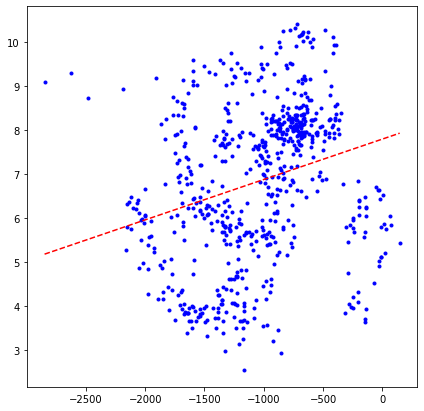

In [78]:
# In the next line, replace sample_boxplot_data.csv with the filename of your data:
data_filename = 'population_regression_data.csv'
# In the next line, replace boxplot with the filename you wish to save as:
output_filename = 'regression_figure.png'

figure_width, figure_height = 7,7
# These lines extract the y-values and the x-values from the data:
x_values = cm15['google_m']
y_values = cm15['l_cases']

# These lines perform the regression procedure:
X_values = sm.add_constant(x_values)
regression_model_a = sm.OLS(y_values, X_values)
regression_model_b = regression_model_a.fit()
# and print a summary of the results:
print(regression_model_b.summary())
print() # blank line

# Now we store all the relevant values:
gradient  = regression_model_b.params[1]
intercept = regression_model_b.params[0]
Rsquared  = regression_model_b.rsquared
MSE       = regression_model_b.mse_resid
pvalue    = regression_model_b.f_pvalue

# And print them:
print("gradient  =", regression_model_b.params[1])
print("intercept =", regression_model_b.params[0])
print("Rsquared  =", regression_model_b.rsquared)
print("MSE       =", regression_model_b.mse_resid)
print("pvalue    =", regression_model_b.f_pvalue)

# This line creates the endpoints of the best-fit line:
x_lobf = [min(x_values),max(x_values)]
y_lobf = [x_lobf[0]*gradient + intercept,x_lobf[1]*gradient + intercept]

# This line creates the figure. 
plt.figure(figsize=(figure_width,figure_height))

# Uncomment these lines to set the axis limits (otherwise they will be set automatically):
#x_min,x_max = 0,5000000
#y_min,y_max = 0,5000000
#plt.xlim([x_min,x_max])
#plt.ylim([y_min,y_max])

# The next lines create and save the plot:
plt.plot(x_values,y_values,'b.',x_lobf,y_lobf,'r--')
plt.savefig(output_filename)

#### Phase 1

In [79]:
phase1=cm15.iloc[:14]
phase1.tail()

,date,new_cases,l_cases,google_m
33,2020-03-19,330,5.802118,-9.00
34,2020-03-20,425,6.054439,-139.50
35,2020-03-21,344,5.843544,72.00
36,2020-03-22,423,6.049733,61.00
37,2020-03-23,673,6.513230,4.75


/opt/anaconda3/lib/python3.8/site-packages/statsmodels/tsa/tsatools.py:142: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only
  x = pd.concat(x[::order], 1)
/opt/anaconda3/lib/python3.8/site-packages/scipy/stats/stats.py:1603: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=14
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "


                            OLS Regression Results                            
Dep. Variable:                l_cases   R-squared:                       0.031
Model:                            OLS   Adj. R-squared:                 -0.050
Method:                 Least Squares   F-statistic:                    0.3823
Date:                Tue, 18 Jan 2022   Prob (F-statistic):              0.548
Time:                        02:29:42   Log-Likelihood:                -10.791
No. Observations:                  14   AIC:                             25.58
Df Residuals:                      12   BIC:                             26.86
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          5.5092      0.151     36.422      0.0

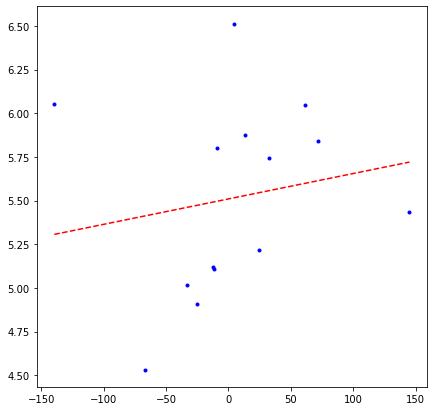

In [80]:
# In the next line, replace sample_boxplot_data.csv with the filename of your data:
data_filename = 'population_regression_data.csv'
# In the next line, replace boxplot with the filename you wish to save as:
output_filename = 'regression_figure.png'

figure_width, figure_height = 7,7
# These lines extract the y-values and the x-values from the data:
x_values = phase1['google_m']
y_values = phase1['l_cases']

# These lines perform the regression procedure:
X_values = sm.add_constant(x_values)
regression_model_a = sm.OLS(y_values, X_values)
regression_model_b = regression_model_a.fit()
# and print a summary of the results:
print(regression_model_b.summary())
print() # blank line

# Now we store all the relevant values:
gradient  = regression_model_b.params[1]
intercept = regression_model_b.params[0]
Rsquared  = regression_model_b.rsquared
MSE       = regression_model_b.mse_resid
pvalue    = regression_model_b.f_pvalue

# And print them:
print("gradient  =", regression_model_b.params[1])
print("intercept =", regression_model_b.params[0])
print("Rsquared  =", regression_model_b.rsquared)
print("MSE       =", regression_model_b.mse_resid)
print("pvalue    =", regression_model_b.f_pvalue)

# This line creates the endpoints of the best-fit line:
x_lobf = [min(x_values),max(x_values)]
y_lobf = [x_lobf[0]*gradient + intercept,x_lobf[1]*gradient + intercept]

# This line creates the figure. 
plt.figure(figsize=(figure_width,figure_height))

# Uncomment these lines to set the axis limits (otherwise they will be set automatically):
#x_min,x_max = 0,5000000
#y_min,y_max = 0,5000000
#plt.xlim([x_min,x_max])
#plt.ylim([y_min,y_max])

# The next lines create and save the plot:
plt.plot(x_values,y_values,'b.',x_lobf,y_lobf,'r--')
plt.savefig(output_filename)

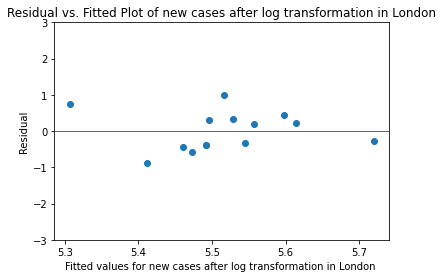

In [81]:
# plot 
plt.scatter(regression_model_b.fittedvalues, regression_model_b.resid)
# adding title and labels
plt.xlabel('Fitted values for new cases after log transformation in London ')
plt.ylabel('Residual')
plt.ylim(-3,3)
plt.title('Residual vs. Fitted Plot of new cases after log transformation in London')
plt.axhline(linewidth=1)
plt.show()

#### Phase2

In [82]:
phase2=cm15.iloc[14:52]
phase2.tail()

,date,new_cases,l_cases,google_m
71,2020-04-26,290,5.673323,-1754.25
72,2020-04-27,409,6.016157,-1779.75
73,2020-04-28,311,5.743003,-2122.00
74,2020-04-29,430,6.066108,-2002.75
75,2020-04-30,424,6.052089,-2004.50


/opt/anaconda3/lib/python3.8/site-packages/statsmodels/tsa/tsatools.py:142: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only
  x = pd.concat(x[::order], 1)


                            OLS Regression Results                            
Dep. Variable:                l_cases   R-squared:                       0.335
Model:                            OLS   Adj. R-squared:                  0.317
Method:                 Least Squares   F-statistic:                     18.16
Date:                Tue, 18 Jan 2022   Prob (F-statistic):           0.000140
Time:                        02:29:43   Log-Likelihood:                -6.6819
No. Observations:                  38   AIC:                             17.36
Df Residuals:                      36   BIC:                             20.64
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          6.7073      0.097     68.892      0.0

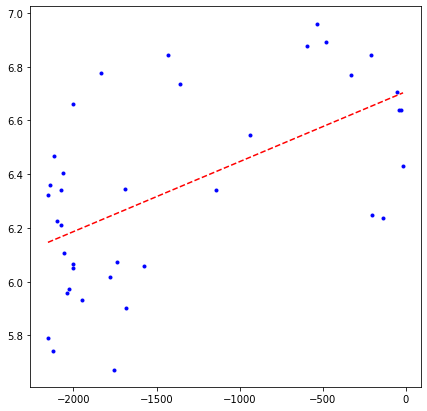

In [83]:
# In the next line, replace sample_boxplot_data.csv with the filename of your data:
data_filename = 'population_regression_data.csv'
# In the next line, replace boxplot with the filename you wish to save as:
output_filename = 'regression_figure.png'

figure_width, figure_height = 7,7
# These lines extract the y-values and the x-values from the data:
x_values = phase2['google_m']
y_values = phase2['l_cases']

# These lines perform the regression procedure:
X_values = sm.add_constant(x_values)
regression_model_a = sm.OLS(y_values, X_values)
regression_model_b = regression_model_a.fit()
# and print a summary of the results:
print(regression_model_b.summary())
print() # blank line

# Now we store all the relevant values:
gradient  = regression_model_b.params[1]
intercept = regression_model_b.params[0]
Rsquared  = regression_model_b.rsquared
MSE       = regression_model_b.mse_resid
pvalue    = regression_model_b.f_pvalue

# And print them:
print("gradient  =", regression_model_b.params[1])
print("intercept =", regression_model_b.params[0])
print("Rsquared  =", regression_model_b.rsquared)
print("MSE       =", regression_model_b.mse_resid)
print("pvalue    =", regression_model_b.f_pvalue)

# This line creates the endpoints of the best-fit line:
x_lobf = [min(x_values),max(x_values)]
y_lobf = [x_lobf[0]*gradient + intercept,x_lobf[1]*gradient + intercept]

# This line creates the figure. 
plt.figure(figsize=(figure_width,figure_height))

# Uncomment these lines to set the axis limits (otherwise they will be set automatically):
#x_min,x_max = 0,5000000
#y_min,y_max = 0,5000000
#plt.xlim([x_min,x_max])
#plt.ylim([y_min,y_max])

# The next lines create and save the plot:
plt.plot(x_values,y_values,'b.',x_lobf,y_lobf,'r--')
plt.savefig(output_filename)

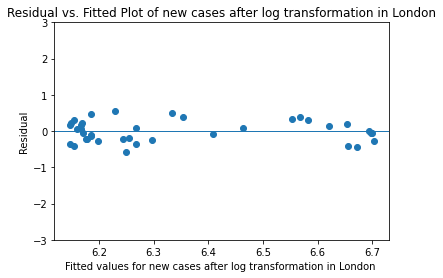

In [84]:
# plot 
plt.scatter(regression_model_b.fittedvalues, regression_model_b.resid)
# adding title and labels
plt.xlabel('Fitted values for new cases after log transformation in London ')
plt.ylabel('Residual')
plt.ylim(-3,3)
plt.title('Residual vs. Fitted Plot of new cases after log transformation in London')
plt.axhline(linewidth=1)
plt.show()

#### Phase 3

In [85]:
phase3=cm15.iloc[52:188]
phase3.tail()

,date,new_cases,l_cases,google_m
207,2020-09-09,51,3.951244,-245.50
208,2020-09-10,50,3.931826,-138.00
209,2020-09-11,331,5.805135,-308.50
210,2020-09-12,232,5.451038,-286.50
211,2020-09-13,115,4.753590,-287.75


/opt/anaconda3/lib/python3.8/site-packages/statsmodels/tsa/tsatools.py:142: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only
  x = pd.concat(x[::order], 1)


                            OLS Regression Results                            
Dep. Variable:                l_cases   R-squared:                       0.050
Model:                            OLS   Adj. R-squared:                  0.043
Method:                 Least Squares   F-statistic:                     7.010
Date:                Tue, 18 Jan 2022   Prob (F-statistic):            0.00908
Time:                        02:29:43   Log-Likelihood:                -123.01
No. Observations:                 136   AIC:                             250.0
Df Residuals:                     134   BIC:                             255.8
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          3.8020      0.158     24.118      0.0

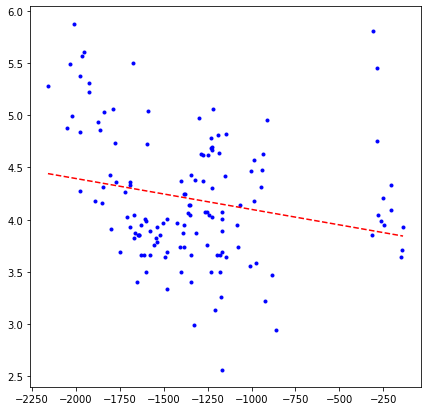

In [86]:
# In the next line, replace sample_boxplot_data.csv with the filename of your data:
data_filename = 'population_regression_data.csv'
# In the next line, replace boxplot with the filename you wish to save as:
output_filename = 'regression_figure.png'

figure_width, figure_height = 7,7
# These lines extract the y-values and the x-values from the data:
x_values = phase3['google_m']
y_values = phase3['l_cases']

# These lines perform the regression procedure:
X_values = sm.add_constant(x_values)
regression_model_a = sm.OLS(y_values, X_values)
regression_model_b = regression_model_a.fit()
# and print a summary of the results:
print(regression_model_b.summary())
print() # blank line

# Now we store all the relevant values:
gradient  = regression_model_b.params[1]
intercept = regression_model_b.params[0]
Rsquared  = regression_model_b.rsquared
MSE       = regression_model_b.mse_resid
pvalue    = regression_model_b.f_pvalue

# And print them:
print("gradient  =", regression_model_b.params[1])
print("intercept =", regression_model_b.params[0])
print("Rsquared  =", regression_model_b.rsquared)
print("MSE       =", regression_model_b.mse_resid)
print("pvalue    =", regression_model_b.f_pvalue)

# This line creates the endpoints of the best-fit line:
x_lobf = [min(x_values),max(x_values)]
y_lobf = [x_lobf[0]*gradient + intercept,x_lobf[1]*gradient + intercept]

# This line creates the figure. 
plt.figure(figsize=(figure_width,figure_height))

# Uncomment these lines to set the axis limits (otherwise they will be set automatically):
#x_min,x_max = 0,5000000
#y_min,y_max = 0,5000000
#plt.xlim([x_min,x_max])
#plt.ylim([y_min,y_max])

# The next lines create and save the plot:
plt.plot(x_values,y_values,'b.',x_lobf,y_lobf,'r--')
plt.savefig(output_filename)

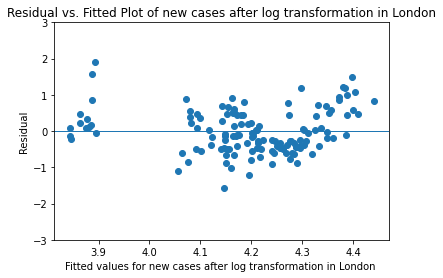

In [87]:
# plot 
plt.scatter(regression_model_b.fittedvalues, regression_model_b.resid)
# adding title and labels
plt.xlabel('Fitted values for new cases after log transformation in London ')
plt.ylabel('Residual')
plt.ylim(-3,3)
plt.title('Residual vs. Fitted Plot of new cases after log transformation in London')
plt.axhline(linewidth=1)
plt.show()

#### Phase4

In [88]:
phase4=cm15.iloc[188:301]
phase4.tail()

,date,new_cases,l_cases,google_m
320,2020-12-31,12198,9.409109,-1193.25
321,2021-01-01,6762,8.819222,-1103.75
322,2021-01-02,13645,9.521202,-1229.25
323,2021-01-03,13130,9.482731,-976.25
324,2021-01-04,17015,9.741909,-1277.25


/opt/anaconda3/lib/python3.8/site-packages/statsmodels/tsa/tsatools.py:142: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only
  x = pd.concat(x[::order], 1)


                            OLS Regression Results                            
Dep. Variable:                l_cases   R-squared:                       0.313
Model:                            OLS   Adj. R-squared:                  0.307
Method:                 Least Squares   F-statistic:                     50.56
Date:                Tue, 18 Jan 2022   Prob (F-statistic):           1.19e-10
Time:                        02:29:43   Log-Likelihood:                -139.78
No. Observations:                 113   AIC:                             283.6
Df Residuals:                     111   BIC:                             289.0
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          6.0135      0.251     23.946      0.0

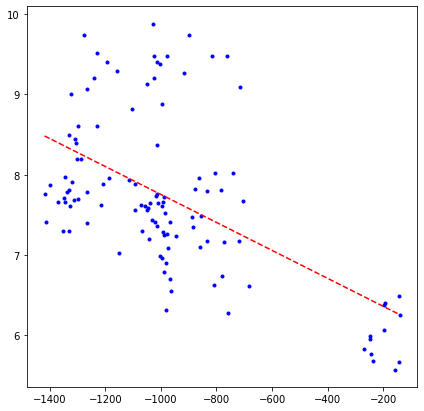

In [89]:
# In the next line, replace sample_boxplot_data.csv with the filename of your data:
data_filename = 'population_regression_data.csv'
# In the next line, replace boxplot with the filename you wish to save as:
output_filename = 'regression_figure.png'

figure_width, figure_height = 7,7
# These lines extract the y-values and the x-values from the data:
x_values = phase4['google_m']
y_values = phase4['l_cases']

# These lines perform the regression procedure:
X_values = sm.add_constant(x_values)
regression_model_a = sm.OLS(y_values, X_values)
regression_model_b = regression_model_a.fit()
# and print a summary of the results:
print(regression_model_b.summary())
print() # blank line

# Now we store all the relevant values:
gradient  = regression_model_b.params[1]
intercept = regression_model_b.params[0]
Rsquared  = regression_model_b.rsquared
MSE       = regression_model_b.mse_resid
pvalue    = regression_model_b.f_pvalue

# And print them:
print("gradient  =", regression_model_b.params[1])
print("intercept =", regression_model_b.params[0])
print("Rsquared  =", regression_model_b.rsquared)
print("MSE       =", regression_model_b.mse_resid)
print("pvalue    =", regression_model_b.f_pvalue)

# This line creates the endpoints of the best-fit line:
x_lobf = [min(x_values),max(x_values)]
y_lobf = [x_lobf[0]*gradient + intercept,x_lobf[1]*gradient + intercept]

# This line creates the figure. 
plt.figure(figsize=(figure_width,figure_height))

# Uncomment these lines to set the axis limits (otherwise they will be set automatically):
#x_min,x_max = 0,5000000
#y_min,y_max = 0,5000000
#plt.xlim([x_min,x_max])
#plt.ylim([y_min,y_max])

# The next lines create and save the plot:
plt.plot(x_values,y_values,'b.',x_lobf,y_lobf,'r--')
plt.savefig(output_filename)

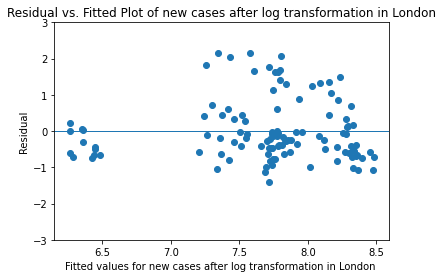

In [90]:
# plot 
plt.scatter(regression_model_b.fittedvalues, regression_model_b.resid)
# adding title and labels
plt.xlabel('Fitted values for new cases after log transformation in London ')
plt.ylabel('Residual')
plt.ylim(-3,3)
plt.title('Residual vs. Fitted Plot of new cases after log transformation in London')
plt.axhline(linewidth=1)
plt.show()

#### Phase 5

In [91]:
phase5=cm15.iloc[301:448]
phase5.tail()

,date,new_cases,l_cases,google_m
467,2021-05-27,471,6.156979,-885.00
468,2021-05-28,388,5.963579,-1016.75
469,2021-05-29,377,5.934894,-903.75
470,2021-05-30,385,5.955837,-797.25
471,2021-05-31,451,6.113682,-888.50


                            OLS Regression Results                            
Dep. Variable:                l_cases   R-squared:                       0.485
Model:                            OLS   Adj. R-squared:                  0.481
Method:                 Least Squares   F-statistic:                     136.5
Date:                Tue, 18 Jan 2022   Prob (F-statistic):           1.22e-22
Time:                        02:29:43   Log-Likelihood:                -187.01
No. Observations:                 147   AIC:                             378.0
Df Residuals:                     145   BIC:                             384.0
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          3.1610      0.302     10.482      0.0

/opt/anaconda3/lib/python3.8/site-packages/statsmodels/tsa/tsatools.py:142: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only
  x = pd.concat(x[::order], 1)


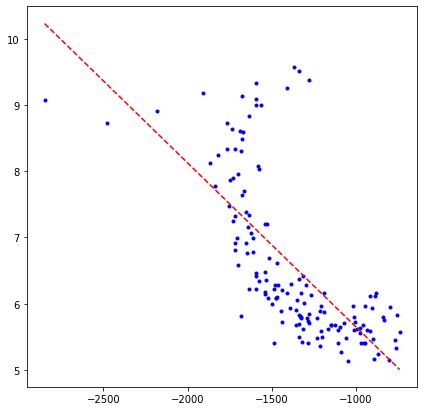

In [92]:
# In the next line, replace sample_boxplot_data.csv with the filename of your data:
data_filename = 'population_regression_data.csv'
# In the next line, replace boxplot with the filename you wish to save as:
output_filename = 'regression_figure.png'

figure_width, figure_height = 7,7
# These lines extract the y-values and the x-values from the data:
x_values = phase5['google_m']
y_values = phase5['l_cases']

# These lines perform the regression procedure:
X_values = sm.add_constant(x_values)
regression_model_a = sm.OLS(y_values, X_values)
regression_model_b = regression_model_a.fit()
# and print a summary of the results:
print(regression_model_b.summary())
print() # blank line

# Now we store all the relevant values:
gradient  = regression_model_b.params[1]
intercept = regression_model_b.params[0]
Rsquared  = regression_model_b.rsquared
MSE       = regression_model_b.mse_resid
pvalue    = regression_model_b.f_pvalue

# And print them:
print("gradient  =", regression_model_b.params[1])
print("intercept =", regression_model_b.params[0])
print("Rsquared  =", regression_model_b.rsquared)
print("MSE       =", regression_model_b.mse_resid)
print("pvalue    =", regression_model_b.f_pvalue)

# This line creates the endpoints of the best-fit line:
x_lobf = [min(x_values),max(x_values)]
y_lobf = [x_lobf[0]*gradient + intercept,x_lobf[1]*gradient + intercept]

# This line creates the figure. 
plt.figure(figsize=(figure_width,figure_height))

# Uncomment these lines to set the axis limits (otherwise they will be set automatically):
#x_min,x_max = 0,5000000
#y_min,y_max = 0,5000000
#plt.xlim([x_min,x_max])
#plt.ylim([y_min,y_max])

# The next lines create and save the plot:
plt.plot(x_values,y_values,'b.',x_lobf,y_lobf,'r--')
plt.savefig(output_filename)

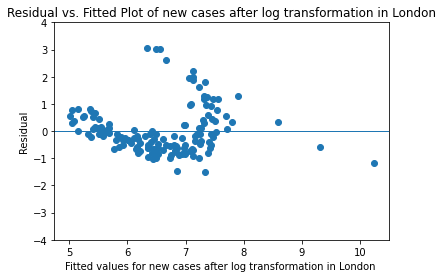

In [93]:
# plot 
plt.scatter(regression_model_b.fittedvalues, regression_model_b.resid)
# adding title and labels
plt.xlabel('Fitted values for new cases after log transformation in London ')
plt.ylabel('Residual')
plt.ylim(-4,4)
plt.title('Residual vs. Fitted Plot of new cases after log transformation in London')
plt.axhline(linewidth=1)
plt.show()

#### Phase 6

In [94]:
phase6=cm15.iloc[448:]
phase6.tail()

,date,new_cases,l_cases,google_m
695,2022-01-10,14478,9.580455,-1594.00
696,2022-01-11,12534,9.436280,-1503.50
697,2022-01-12,11126,9.317130,-1460.00
698,2022-01-13,10140,9.224342,-1253.25
699,2022-01-14,9063,9.112066,-1151.75


/opt/anaconda3/lib/python3.8/site-packages/statsmodels/tsa/tsatools.py:142: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only
  x = pd.concat(x[::order], 1)


                            OLS Regression Results                            
Dep. Variable:                l_cases   R-squared:                       0.000
Model:                            OLS   Adj. R-squared:                 -0.004
Method:                 Least Squares   F-statistic:                 0.0002282
Date:                Tue, 18 Jan 2022   Prob (F-statistic):              0.988
Time:                        02:29:44   Log-Likelihood:                -281.28
No. Observations:                 228   AIC:                             566.6
Df Residuals:                     226   BIC:                             573.4
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          8.2736      0.186     44.576      0.0

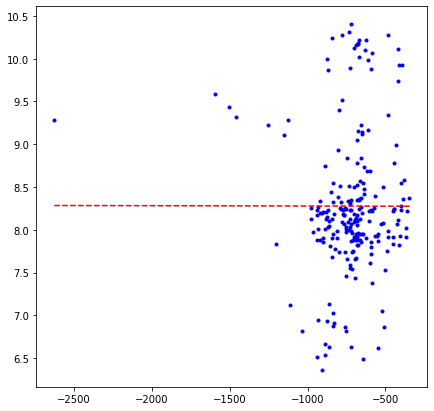

In [95]:
# In the next line, replace sample_boxplot_data.csv with the filename of your data:
data_filename = 'population_regression_data.csv'
# In the next line, replace boxplot with the filename you wish to save as:
output_filename = 'regression_figure.png'

figure_width, figure_height = 7,7
# These lines extract the y-values and the x-values from the data:
x_values = phase6['google_m']
y_values = phase6['l_cases']

# These lines perform the regression procedure:
X_values = sm.add_constant(x_values)
regression_model_a = sm.OLS(y_values, X_values)
regression_model_b = regression_model_a.fit()
# and print a summary of the results:
print(regression_model_b.summary())
print() # blank line

# Now we store all the relevant values:
gradient  = regression_model_b.params[1]
intercept = regression_model_b.params[0]
Rsquared  = regression_model_b.rsquared
MSE       = regression_model_b.mse_resid
pvalue    = regression_model_b.f_pvalue

# And print them:
print("gradient  =", regression_model_b.params[1])
print("intercept =", regression_model_b.params[0])
print("Rsquared  =", regression_model_b.rsquared)
print("MSE       =", regression_model_b.mse_resid)
print("pvalue    =", regression_model_b.f_pvalue)

# This line creates the endpoints of the best-fit line:
x_lobf = [min(x_values),max(x_values)]
y_lobf = [x_lobf[0]*gradient + intercept,x_lobf[1]*gradient + intercept]

# This line creates the figure. 
plt.figure(figsize=(figure_width,figure_height))

# Uncomment these lines to set the axis limits (otherwise they will be set automatically):
#x_min,x_max = 0,5000000
#y_min,y_max = 0,5000000
#plt.xlim([x_min,x_max])
#plt.ylim([y_min,y_max])

# The next lines create and save the plot:
plt.plot(x_values,y_values,'b.',x_lobf,y_lobf,'r--')
plt.savefig(output_filename)

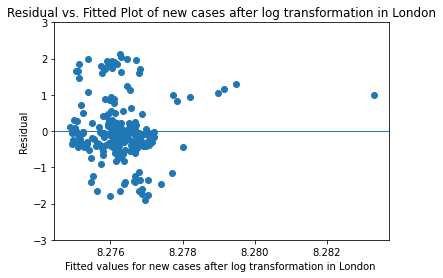

In [96]:
# plot 
plt.scatter(regression_model_b.fittedvalues, regression_model_b.resid)
# adding title and labels
plt.xlabel('Fitted values for new cases after log transformation in London ')
plt.ylabel('Residual')
plt.ylim(-3,3)
plt.title('Residual vs. Fitted Plot of new cases after log transformation in London')
plt.axhline(linewidth=1)
plt.show()